In [1]:
# ==================================================================
# 1. 환경 설정 및 라이브러리 임포트
# ==================================================================
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math
import os
import pickle
import copy
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

#@title 1. DATA_PATH 설정 (Google Drive의 폴더 경로를 입력해주세요.)
DATA_PATH = "/content/drive/MyDrive/constellation" #@param

# 2. 현재 작업 디렉토리 변경 (Change Directory)
os.chdir(DATA_PATH)

Mounted at /content/drive


In [2]:
# ==================================================================
# 2. 연산 보조 함수
# ==================================================================

# 두 점 사이의 유클리드 거리 계산
def dist(p1, p2):
	return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

# 세 점이 이루는 각도 계산
def getAngle(p0, p1, p2):
	return math.acos((dist(p0, p1)**2 + dist(p0, p2)**2 - dist(p1, p2)**2)/(2*(dist(p0, p1)**2)*(dist(p0, p2)**2)))

In [3]:
# ==================================================================
# 3-1. 좌표 정규화
# ==================================================================

# 좌표 변환 함수
def getNormalisedCoordinates(x, y, brightest_index, second_brightest_index, lines=[]):

	x = copy.deepcopy(x)
	y = copy.deepcopy(y)

	lines = np.array(lines)

	for line in lines:
		for x1,y1,x2,y2 in line:
			x1 -= x[brightest_index]
			y1 -= y[brightest_index]
			x2 -= x[brightest_index]
			y2 -= y[brightest_index]
			line[0][0] = x1
			line[0][1] = y1
			line[0][2] = x2
			line[0][3] = y2

	for i in range(len(x)):
		x[len(x)-i-1] -= x[brightest_index]
		y[len(x)-i-1] -= y[brightest_index]

	distance_brightest = math.sqrt((x[brightest_index]-x[second_brightest_index])**2 + (y[brightest_index]-y[second_brightest_index])**2)

	for i in range(len(x)):
		x[i] = x[i]/distance_brightest
		y[i] = y[i]/distance_brightest
	lines = lines/distance_brightest

	p0 = (x[brightest_index], y[brightest_index])
	p1 = (x[second_brightest_index], y[second_brightest_index])
	p2 = (1, 0)
	theta = getAngle(p0, p1, p2)
	if round(x[second_brightest_index]*math.cos(theta) - y[second_brightest_index]*math.sin(theta), 2) != float(1) or round(x[second_brightest_index]*math.sin(theta) + y[second_brightest_index]*math.cos(theta), 2) != float(0):
		theta = -theta

	for i in range(1, len(x)):
		x_new = x[i]*math.cos(theta) - y[i]*math.sin(theta)
		y_new = x[i]*math.sin(theta) + y[i]*math.cos(theta)
		x[i], y[i] = round(x_new, 2), round(y_new, 2)

	for line in lines:
		for x1,y1,x2,y2 in line:
			x1_new = x1*math.cos(theta) - y1*math.sin(theta)
			y1_new = x1*math.sin(theta) + y1*math.cos(theta)
			x2_new = x2*math.cos(theta) - y2*math.sin(theta)
			y2_new = x2*math.sin(theta) + y2*math.cos(theta)
			line[0][0] = x1_new
			line[0][1] = y1_new
			line[0][2] = x2_new
			line[0][3] = y2_new

	return np.array(x), np.array(y), lines

In [4]:
# ==================================================================
# 3-2. 좌표 정규화
# ==================================================================

#영역 반복 함수
def iterateArea(contours, lines=[], iterate=False):
	# print(f"DEBUG-1. 입력 contours 개수: {len(contours)}")
	# print(f"DEBUG-1. 입력 lines 타입/개수: {type(lines)} / {len(lines)}")

	lines = np.array(lines)
	coordinates = {}

	# 1. 윤곽선 무게 중심 계산 및 저장
	for i in range(len(contours)):
		cnt = contours[i]
		M = cv2.moments(cnt)

		# M['m00']이 0일 때 0으로 나누기 오류 방지
		if M['m00'] == 0:
				#print(f"DEBUG-2. 주의: contour {i}의 면적(m00)이 0입니다. 건너뜀.")
				continue

		# 중심 좌표 계산
		cx = int(M['m10']/M['m00'])
		cy = int(M['m01']/M['m00'])
		area = cv2.contourArea(cnt)

		key_area = area
		collision_count = 0 # 충돌 횟수 카운터 추가

		while key_area in coordinates:
			key_area += 0.0001
			collision_count += 1

		#if collision_count > 0:
			#print(f"DEBUG: Area {area} 키 충돌 발생. {key_area:.4f}로 저장. (총 {collision_count}회 충돌)")

		coordinates[key_area] = (cx, cy)

	# print(f"DEBUG-3. 계산된 유효 별 좌표 개수: {len(coordinates)}")

	sorted_area = []
	for i in reversed(sorted(coordinates.keys())):
		sorted_area.append(i)

	x = []
	y = []

	for area in sorted_area:
		x.append(coordinates[area][0])	# 면적이 가장 큰 순서대로 x 좌표를 저장
		y.append(coordinates[area][1])	# 면적이 가장 큰 순서대로 y 좌표를 저장

	# 템플릿 생성시
	if iterate == False:
		return getNormalisedCoordinates(x, y, 0, 1, lines)

	# 테스트셋 생성시
	else:
		threshold = 15	#면적 최소 임계값
		count = 0

		for area in sorted_area:
			if area >= threshold:
				count += 1
			if area < threshold:
				break
			if count > 50:
				count = 50
		print(f"DEBUG-4. 면적 임계값({threshold}) 이상인 객체 개수 (count): {count}")
		coordinates_list = []
		for i in range(count):
			for j in range(i+1, count):
				x_new, y_new, _ = getNormalisedCoordinates(x[i:], y[i:], 0, j-i, lines)
				coordinates_list.append((x_new, y_new))

		return coordinates_list, x, y, count

In [5]:
# ==================================================================
# 4. 이미지 처리
# ==================================================================

# 엣지 검출 1. Canny 기법
def findEdges(image, thresh1, thresh2):
	out = cv2.Canny(np.array(image), thresh1, thresh2)
	return out

# 엣지 검출 2. 색상 반전
def invertImage(image):
	return cv2.bitwise_not(image)

# 전처리 1. 흑백 변환
def getGrayscale(image):
	return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 전처리 2. 노이즈 제거 (중앙값 사용)
def applyMedian(image, size):
	return cv2.medianBlur(image, size)

# 이진화 (임계값 기준 흑백 분리)
def binariseImage(img, thresholds):
	output_thresh = []
	for threshold in thresholds:
		ret,thresh = cv2.threshold(img,threshold,255,cv2.THRESH_BINARY)
		output_thresh.append(thresh)
	return output_thresh

# RGB 채널 분리: RED-주로 별의 위치, BLUE-별 사이의 거리, GREEN

def getGreenChannel(img):
	image_copy_green = img.copy()
	# Setting Green and Red channel 0
	image_copy_green[:, :, 0] = 0
	image_copy_green[:, :, 2] = 0
	return image_copy_green

def getBlueChannel(img):
	image_copy_blue = img.copy()
	# Setting Green and Red channel 0
	image_copy_blue[:, :, 1] = 0
	image_copy_blue[:, :, 2] = 0
	return image_copy_blue

def getRedChannel(img):
	# Setting Green and Blue channel 0
	image_copy = img.copy()
	image_copy[:, :, 1] = 0
	image_copy[:, :, 0] = 0
	return image_copy

In [6]:
# ==================================================================
# [수정됨] 처리 과정을 시각화하는 함수
# ==================================================================

def visualize_template_processing(image_path):
    # 1. 이미지 읽기 (Original Template)
    img = cv2.imread(image_path)
    if img is None:
        print(f"이미지를 찾을 수 없습니다: {image_path}")
        return

    # Matplotlib 출력을 위해 BGR -> RGB 변환
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 2. RGB 채널 분리 (Separated RGB Channel)
    # 원본 코드 로직: 각 채널 함수는 다른 채널을 0으로 만든 이미지를 반환함
    red_channel = getRedChannel(img)
    green_channel = getGreenChannel(img)
    blue_channel = getBlueChannel(img)

    # 시각화를 위해 RGB로 변환
    red_vis = cv2.cvtColor(red_channel, cv2.COLOR_BGR2RGB)
    green_vis = cv2.cvtColor(green_channel, cv2.COLOR_BGR2RGB)
    blue_vis = cv2.cvtColor(blue_channel, cv2.COLOR_BGR2RGB)

    # 3. 별과 선 추출 로직 (Binarized Lines and Stars)
    # (1) 별 추출 로직 (Red 채널의 특정 밝기 범위 추출)
    # thresh[0]: 165.75 이상, thresh[1]: 191.25 이상
    # final = 165.75 ~ 191.25 사이의 밝기값 (주로 별)
    thresh = binariseImage(red_channel, [165.75, 191.25])
    final = thresh[0] - thresh[1]
    stars = applyMedian(final, 3)
    stars_grey = getGrayscale(stars)
    # 최종 별 이진화 이미지
    final_stars = binariseImage(stars_grey, [20])[0]

    # (2) 선 및 글자 추출 로직 (Blue 채널 + Red 채널의 일부)
    # Red 채널에서 125.75 ~ 255 사이 (글자 등) 추출
    thresh2 = binariseImage(red_channel, [125.75, 255])
    letters = thresh2[0] - thresh2[1]

    # Blue 채널과 합치기 (이때 Blue가 섞인 픽셀 정리)
    new_blue = blue_channel + letters
    for i in range(len(new_blue)):
        for j in range(len(new_blue[i])):
            if new_blue[i][j][2] != 0: # Red 성분이 있으면
                new_blue[i][j][1] = 0
                new_blue[i][j][0] = 0
                new_blue[i][j][2] = 0

    lines = applyMedian(new_blue, 3)
    lines_grey = getGrayscale(lines)
    # 최종 선 이진화 이미지 (반전 전)
    final_lines = binariseImage(lines_grey, [5])[0]

    # 시각화 (반전시켜서 보기 편하게, 혹은 코드 흐름대로)
    final_stars_vis = final_stars
    final_lines_vis = final_lines

    # ==========================================
    # 결과 출력
    # ==========================================
    plt.figure(figsize=(15, 12))

    # 1. Original
    plt.subplot(3, 3, 1)
    plt.title("Original Template")
    plt.imshow(img_rgb)
    plt.axis('off')

    # 2. RGB Channels
    plt.subplot(3, 3, 4)
    plt.title("Red Channel (Stars Source)")
    plt.imshow(red_vis)
    plt.axis('off')

    plt.subplot(3, 3, 5)
    plt.title("Green Channel")
    plt.imshow(green_vis)
    plt.axis('off')

    plt.subplot(3, 3, 6)
    plt.title("Blue Channel (Lines Source)")
    plt.imshow(blue_vis)
    plt.axis('off')
    '''
    # 3. Processed Intermediate
    # 별 추출 중간 단계 (Range: 165-191)
    plt.subplot(3, 3, 7)
    plt.title("3-1. Red Range Extract (Stars)")
    plt.imshow(cv2.cvtColor(final, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    '''

    # 4. Final Binarized
    plt.subplot(3, 3, 2)
    plt.title("Binarized Stars")
    plt.imshow(final_stars_vis, cmap='gray')
    plt.axis('off')

    plt.subplot(3, 3, 3)
    plt.title("Binarized Lines")
    plt.imshow(final_lines_vis, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

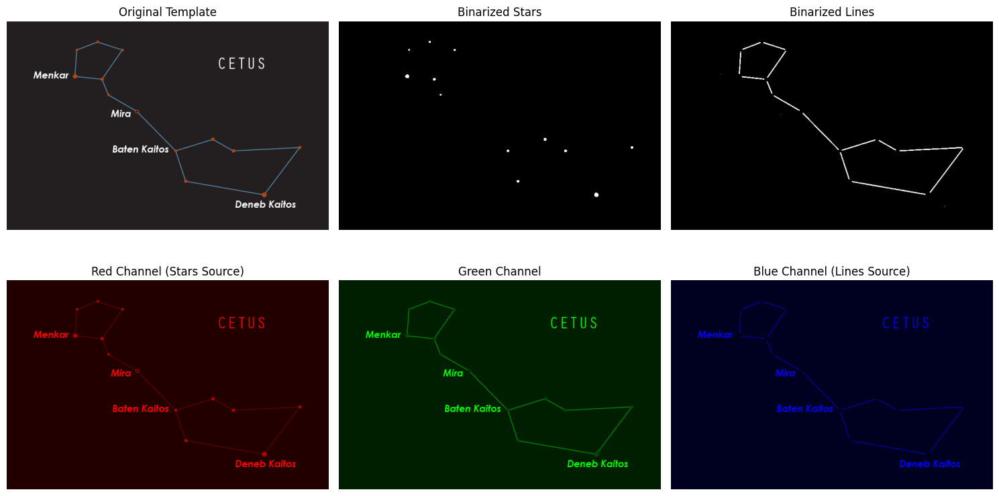

In [7]:
visualize_template_processing(DATA_PATH + "/Templates/Cetus.png")

In [8]:
def show_process_in_colab(image_path):
    # (1) 이미지 읽기
    img = cv2.imread(image_path)
    if img is None:
        print(f"이미지를 찾을 수 없습니다: {image_path}")
        return

    print(f"▶ 1. 원본 템플릿 (Original): {image_path}")
    cv2_imshow(img)  # 바로 출력
    print("\n" + "="*50 + "\n")

    # (2) RGB 채널 분리
    red_channel = getRedChannel(img)
    green_channel = getGreenChannel(img)
    blue_channel = getBlueChannel(img)

    print("▶ 2. RGB 채널 분리 (Separated RGB Channels)")
    print("- Red Channel (별 추출용)")
    cv2_imshow(red_channel)

    print("- Green Channel")
    cv2_imshow(green_channel)

    print("- Blue Channel (선 추출용)")
    cv2_imshow(blue_channel)
    print("\n" + "="*50 + "\n")

    # (3) 별(Stars) 추출 및 이진화
    # Red 채널에서 165.75 ~ 191.25 밝기 범위 추출
    thresh_stars = binariseImage(red_channel, [165.75, 191.25])
    stars_diff = thresh_stars[0] - thresh_stars[1]
    stars_median = applyMedian(stars_diff, 3)
    stars_grey = getGrayscale(stars_median)
    final_stars = binariseImage(stars_grey, [20])[0]

    print("▶ 3. 별 추출 결과 (Binarized Stars)")
    cv2_imshow(final_stars)
    print("\n" + "="*50 + "\n")

    # (4) 선(Lines) 추출 및 이진화
    # Red 채널 일부(글자 등) + Blue 채널
    thresh_lines_red = binariseImage(red_channel, [125.75, 255])
    letters = thresh_lines_red[0] - thresh_lines_red[1]

    new_blue = blue_channel + letters
    # Red 성분이 섞인 픽셀 제거 (벡터화 연산)
    mask = new_blue[:, :, 2] != 0
    new_blue[mask] = 0

    lines_median = applyMedian(new_blue, 3)
    lines_grey = getGrayscale(lines_median)
    final_lines = binariseImage(lines_grey, [5])[0]

    print("▶ 4. 선 추출 결과 (Binarized Lines)")
    cv2_imshow(final_lines)
    print("\n" + "="*50 + "\n")



▶ 1. 원본 템플릿 (Original): Templates/Orion.png


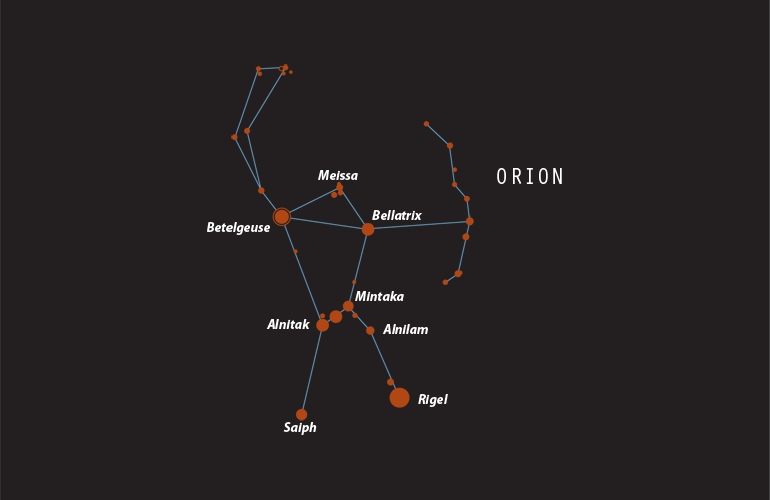



▶ 2. RGB 채널 분리 (Separated RGB Channels)
- Red Channel (별 추출용)


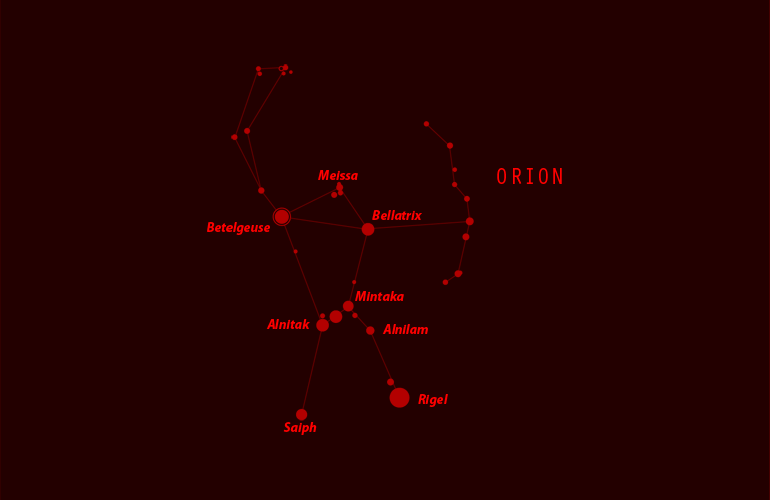

- Green Channel


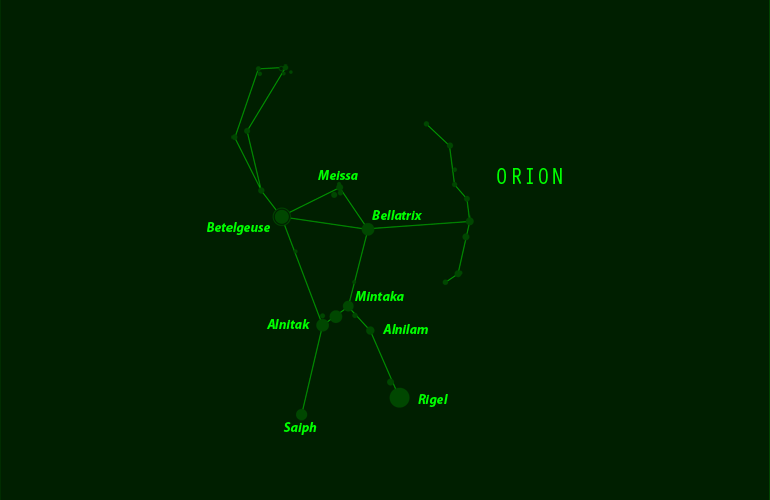

- Blue Channel (선 추출용)


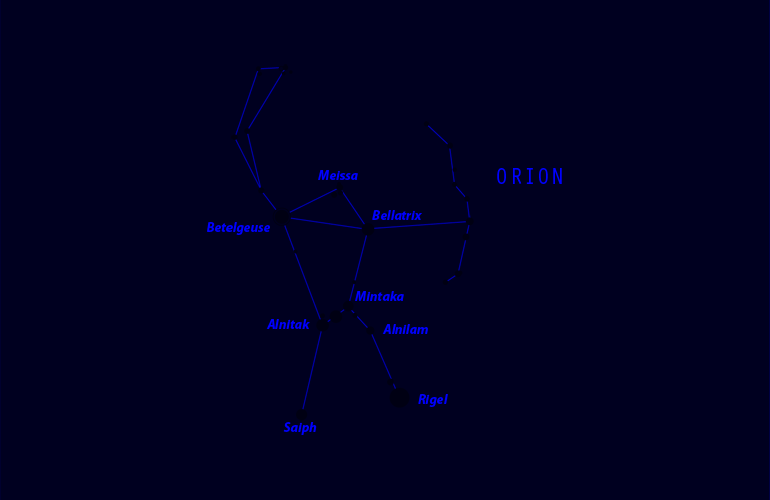



▶ 3. 별 추출 결과 (Binarized Stars)


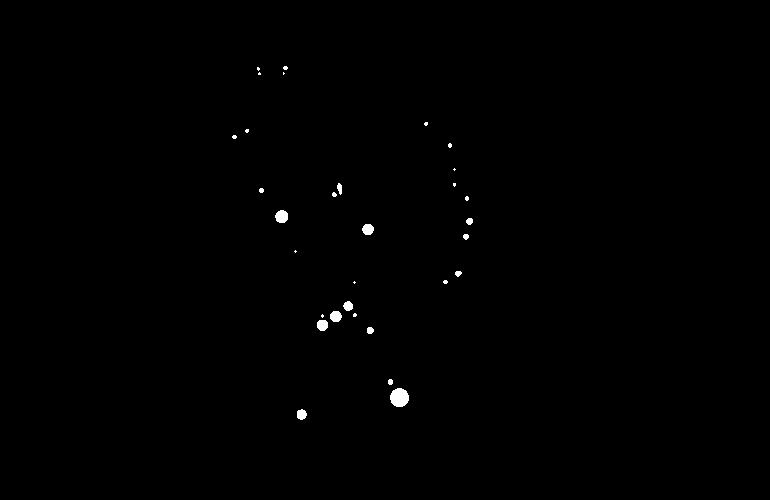



▶ 4. 선 추출 결과 (Binarized Lines)


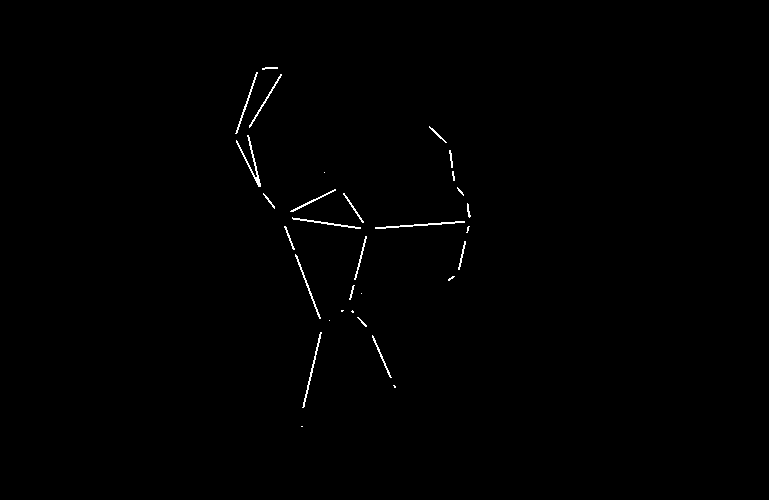

In [9]:
show_process_in_colab("Templates/Orion.png")

In [10]:
# ==================================================================
# 원본 vs 전처리 보정 사진 비교 시각화 함수
# ==================================================================

def compare_preprocessing(image_path):
    """
    원본 이미지와 전처리(배경 제거 및 별 강조)된 이미지를 나란히 비교하여 출력합니다.
    """
    # 1. 이미지 읽기
    img = cv2.imread(image_path)
    if img is None:
        print(f"이미지를 찾을 수 없습니다: {image_path}")
        return

    # 화면 표시를 위해 BGR -> RGB 변환
    original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 2. 전처리 수행 (기존 코드 로직 적용)
    # Grayscale 변환
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img

    # 노이즈 제거 및 별 강조 (Top-Hat + Blur)
    # 배경의 광해를 제거하고 별을 도드라지게 함
    kernel_tophat = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (100, 100))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel_tophat)
    processed_img = cv2.GaussianBlur(tophat, (3, 3), 0)

    # 3. 시각화 (좌: 원본, 우: 보정본)
    plt.figure(figsize=(14, 7))

    # 원본 이미지 출력
    plt.subplot(1, 2, 1)
    plt.title("Original Image", fontsize=14)
    plt.imshow(original_rgb)
    plt.axis('off')

    # 보정된 이미지 출력 (흑백)
    plt.subplot(1, 2, 2)
    plt.title("Preprocessed Image", fontsize=14)
    plt.imshow(processed_img, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


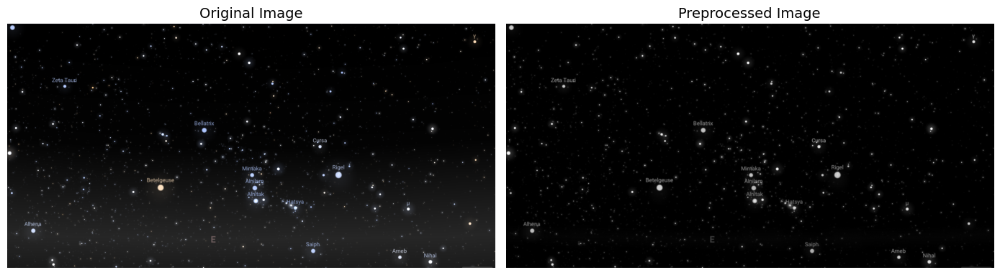

In [11]:
compare_preprocessing('test_data/Orion.png')

In [12]:
# ==================================================================
# 5. 템플릿 생성 (경계 제거 로직 추가)
# ==================================================================

def makeTemplates():

	template_directory = DATA_PATH + "/Templates/"
	templates_coordinates = {}
	print(f"총 {len(os.listdir(template_directory))}개의 템플릿을 생성합니다.")
	for filename in os.listdir(template_directory):
		img = cv2.imread( template_directory + filename)

		# 원본 이미지에 경계 검정 마스킹 적용
		height, width = img.shape[:2]
		border_width = 5 # 제거할 경계의 픽셀 두께
		img[0:border_width, :] = 0
		img[height - border_width:, :] = 0
		img[:, 0:border_width] = 0
		img[:, width - border_width:] = 0


		red_channel = getRedChannel(img)
		thresh = binariseImage(red_channel, [165.75, 191.25])
		blue_channel = getBlueChannel(img)
		thresh2 = binariseImage(red_channel, [125.75, 255])
		letters = thresh2[0] - thresh2[1]
		new_blue = blue_channel + letters

		# 문자 영역 분리
		for i in range(len(new_blue)):
			for j in range(len(new_blue[i])):
				if new_blue[i][j][2] != 0:
					new_blue[i][j][1] = 0
					new_blue[i][j][0] = 0
					new_blue[i][j][2] = 0

		final = thresh[0] - thresh[1]

		stars = applyMedian(final, 3)
		lines = applyMedian(new_blue, 3)


		stars_grey = getGrayscale(stars)
		lines_grey = getGrayscale(lines)
		final_stars = binariseImage(stars_grey, [20])
		final_lines = binariseImage(lines_grey, [5])
		final_stars_inverted = invertImage(final_stars[0])
		final_lines_inverted = invertImage(final_lines[0])
		final_lines = applyMedian(final_lines[0], 3)


		edged = findEdges(final_stars_inverted, 30, 200)

		rho = 1  # distance resolution in pixels of the Hough grid
		theta = np.pi / 180  # angular resolution in radians of the Hough grid
		threshold = 10  # minimum number of votes (intersections in Hough grid cell)
		min_line_length = 2  # minimum number of pixels making up a line
		max_line_gap = 3  # maximum gap in pixels between connectable line segments
		line_image = np.copy(img) * 0  # creating a blank to draw lines on

		drawn_lines = cv2.HoughLinesP(final_lines, rho, theta, threshold, np.array([]), min_line_length, max_line_gap)


		for line in drawn_lines:
			for x1,y1,x2,y2 in line:
				cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

		#cv2_imshow(edged)				#Canny 엣지 검출 결과
		#cv2_imshow(line_image) 	#Hough Lines 결과 시각화

		edge_copy = edged.copy()
		contours, hierarchy = cv2.findContours(edge_copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
		final_contours = []

		for contour in contours:
			area = cv2.contourArea(contour)
			if area != 0:
				final_contours.append(contour)

		#원본 이미지 위에 윤곽선 검출 결과 시각화
		#contour_image = img.copy()
		#cv2.drawContours(contour_image, final_contours, -1, (0, 255, 0),2)
		#cv2_imshow(contour_image)


		# 별 윤곽선 리스트와 Hough 변환 후 선 세그먼트를 전달한다.
		x, y, normalised_lines = iterateArea(final_contours, drawn_lines)

		# 별자리 딕셔너리에 주요 정보들을 저장합니다
		templates_coordinates[filename[:-4]] = (x, y, len(final_contours) , normalised_lines)

		#plt.title(filename)
		plt.figure("Normalised " + filename[:-4] + " stars")
		plt.scatter(x, y)
		for line in normalised_lines:
			for x1,y1,x2,y2 in line:
				plt.plot([x1, x2], [y1, y2], color='red')
		plt.gca().set_aspect('equal', adjustable='box') #X축과 Y축의 스케일 간격을 동일하게
		plt.title(filename)
		plt.xlabel("X Coordinate (Normalized)")
		plt.ylabel("Y Coordinate (Normalized)")
		plt.show()

	with open("Template Coordinates", "wb") as fp:
		pickle.dump(templates_coordinates, fp)

총 37개의 템플릿을 생성합니다.


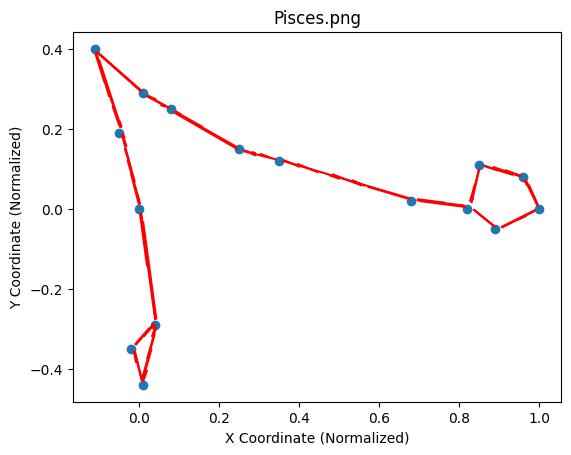

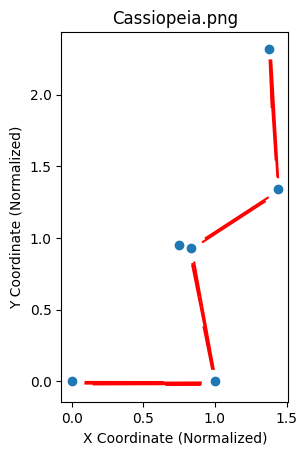

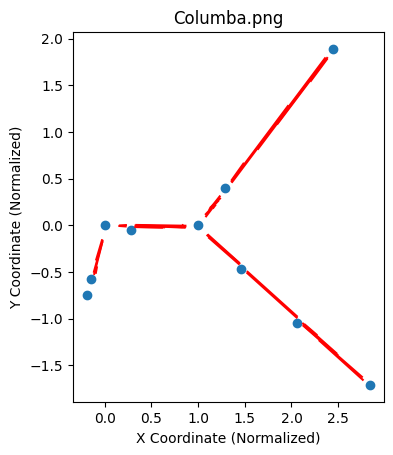

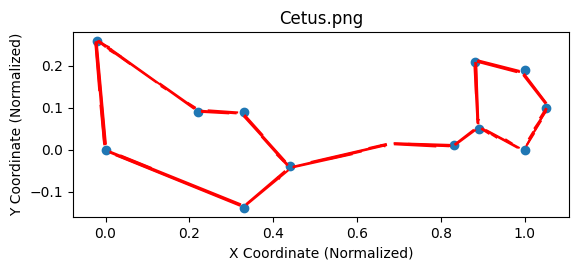

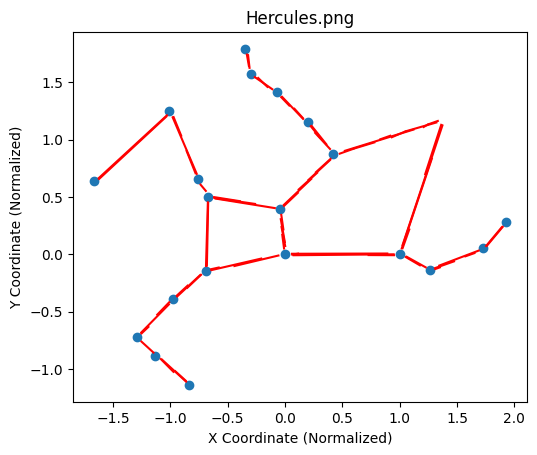

...

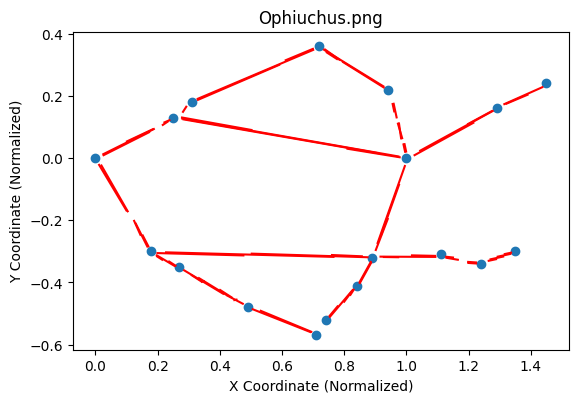

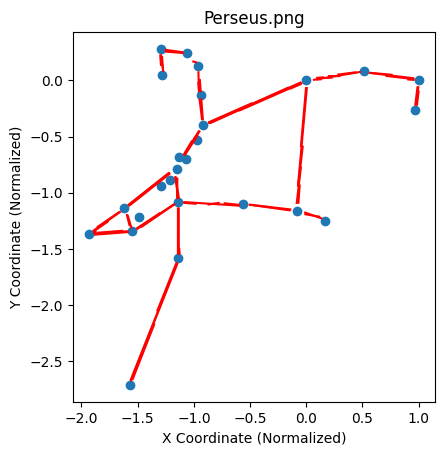

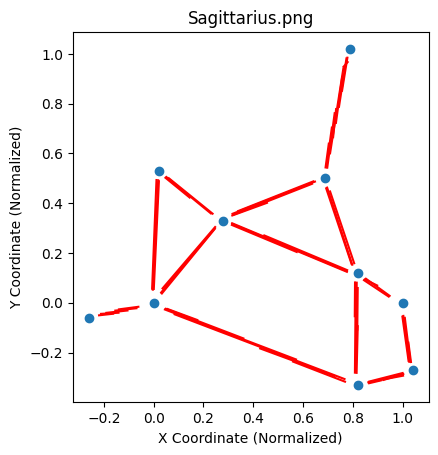

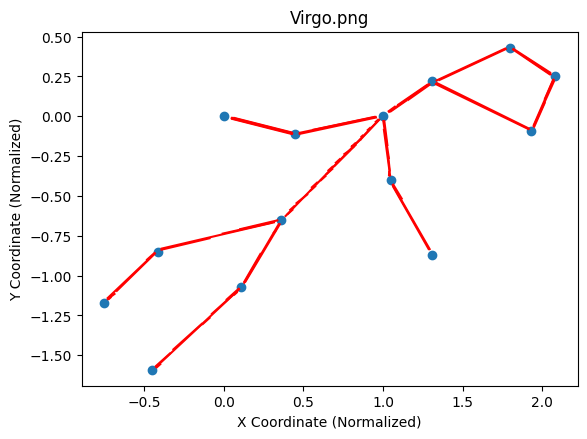

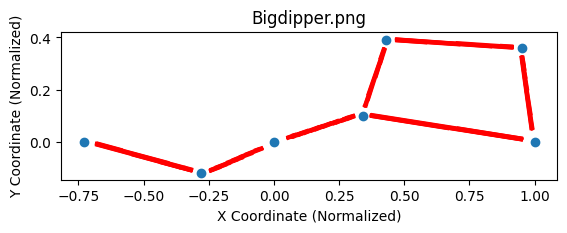

In [13]:
makeTemplates()

In [14]:
# ==================================================================
# 6. 테스트 이미지 분석 (경계 마스크 추가)
# ==================================================================

def test_normaliser(test_path, debug=True, tk = 30):
    debug_images = []

    # 1. 이미지 읽기
    img = cv2.imread(test_path)
    if img is None:
        print(f"이미지를 찾을 수 없습니다: {test_path}")
        return [], [], [], 0, 0, 0

    h, w, _ = img.shape
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    debug_images.append(("1. Original", img_rgb, None))


    # 2. 전처리 (Grayscale 변환)
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
        img = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

    debug_images.append(("2. Grayscale", gray, 'gray'))


    # 3. 노이즈 제거 및 별 강조 (Top-Hat + Blur)
    kernel_tophat = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (100, 100))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel_tophat)
    blurred = cv2.GaussianBlur(tophat, (3, 3), 0)

    debug_images.append(("3. Top-Hat + Weak Blur", blurred, 'gray'))


    # 4. 이진화 (최대 밝기 기준 적응형 임계값)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(blurred)
    # 너무 어두운 사진일 경우를 대비해 최소 임계값(25) 보장
    thresh = max(25, max_val * 0.30)
    ret, binary = cv2.threshold(blurred, thresh, 255, cv2.THRESH_BINARY)

    debug_images.append((f"4. Binary (Thresh={int(thresh)})", binary, 'gray'))


    # 5. Watershed 알고리즘 (별 영역 분리)
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.1, 255, 0)
    sure_fg = np.uint8(sure_fg)

    debug_images.append(("5. Sure FG (Seeds)", sure_fg, 'gray'))

    unknown = cv2.subtract(sure_bg, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0

    markers = cv2.watershed(img, markers)

    ws_result = img_rgb.copy()
    ws_result[markers == -1] = [255, 0, 0]
    debug_images.append(("6. Watershed Result", ws_result, None))

    # 6. 윤곽선 검출 및 필터링
    unique_markers = np.unique(markers)
    all_contours = []

    MIN_AREA = 1
    MAX_AREA = 10000

    for marker_id in unique_markers:
        if marker_id <= 1: continue # 배경 제외

        mask = np.zeros(gray.shape, dtype=np.uint8)
        mask[markers == marker_id] = 255

        cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        for cnt in cnts:
            area = cv2.contourArea(cnt)
            if MIN_AREA <= area <= MAX_AREA:
                all_contours.append(cnt)

    if len(all_contours) < 3:
        # 별이 너무 적으면 빈 값 반환
        return [], [], [], 0, h, w

    # 7. 상위 tk개 별 선정 (면적 순) -> 너무 많으면 연산량 증가 및 노이즈 가능성
    final_contours = sorted(all_contours, key=cv2.contourArea, reverse=True)[:tk]

    # 8. 좌표 추출 (Centroids)
    temp_coords = []
    for cnt in final_contours:
        M = cv2.moments(cnt)
        if M['m00'] == 0: continue
        cx = int(M['m10']/M['m00'])
        cy = int(M['m01']/M['m00'])
        temp_coords.append((cx, cy))

    # set을 이용해 중복을 제거하되, 원래 순서(면적 순)를 유지하기 위해 리스트 순회
    unique_coords = []
    seen = set()
    for coord in temp_coords:
        if coord not in seen:
            unique_coords.append(coord)
            seen.add(coord)

    # 좌표 분리
    raw_x = [c[0] for c in unique_coords]
    raw_y = [c[1] for c in unique_coords]
    count = len(raw_x)

    print(f"최종 선별된 별 개수(중복 제거 후): {count}")
    if count < 2:
         return [], [], [], 0, h, w

    # 9. 좌표 정규화 및 쌍 생성
    coordinates_list = []

    for i in range(count):
        for j in range(i+1, count):
            # [안전 장치] 만약 두 별의 좌표가 같으면 거리 0이 되어 에러 발생 -> 건너뜀
            if raw_x[i] == raw_x[j] and raw_y[i] == raw_y[j]:
                continue

            x_slice = raw_x[i:]
            y_slice = raw_y[i:]

            try:

                x_new, y_new, _ = getNormalisedCoordinates(x_slice, y_slice, 0, j-i, [])
                coordinates_list.append((x_new, y_new))
            except ZeroDivisionError:
                continue

    # 10. 디버그
    if debug:
        print(f"1차 검출된 전체 별 개수: {len(all_contours)}")

        final_result_img = img_rgb.copy()
        for k in range(count):
             cv2.circle(final_result_img, (raw_x[k], raw_y[k]), 5, (0, 255, 0), 2)
             cv2.putText(final_result_img, str(k), (raw_x[k]+10, raw_y[k]), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1)
        debug_images.append(("7. Final Result", final_result_img, None))

        cols = 3
        rows = (len(debug_images) + cols - 1) // cols
        plt.figure(figsize=(15, 5 * rows))

        for i, (title, image, cmap) in enumerate(debug_images):
            plt.subplot(rows, cols, i + 1)
            plt.title(title)
            if cmap:
                plt.imshow(image, cmap=cmap)
            else:
                plt.imshow(image)
            plt.axis('off')
        plt.tight_layout()
        plt.show()



    return coordinates_list, raw_x, raw_y, count, h, w

In [15]:
# ==================================================================
# 7-1. 매칭 및 유사도 측정
# ==================================================================

# 유사도 에러 계산
def simillarity_error(train ,test):
	threshold = 0.04 * 1
	error = 1e-100
	count = 0
	for i in range(train[0].shape[0]) :
		distances = np.sqrt((test[0] - train[0][i]) **2 + (test[1] - train[1][i]) **2)
		min_dist = min(distances)
		if(min_dist < threshold) :
			count += 1
			error += min_dist

	return count , error

In [16]:
# ==================================================================
# 7-2. 매칭 및 유사도 측정
# ==================================================================

# 좌표 매칭 여부 카운트
def score(x , y , template_x , template_y) :
	test_coordinates = {}
	template_coordinates = {}

	for i in range(len(x)):
		test_coordinates[x[i]] = y[i]

	for i in range(len(template_x)):
		template_coordinates[template_x[i]] = template_y[i]

	sorted_x = []
	sorted_y = []
	sorted_template_x = []
	sorted_template_y = []

	for i in sorted(test_coordinates.keys()):
		sorted_x.append(i)
		sorted_y.append(test_coordinates[i])

	for i in sorted(template_coordinates.keys()):
		sorted_template_x.append(i)
		sorted_template_y.append(template_coordinates[i])

	index_test = 0
	index_template = 0

	count = 0
	matched_coord = []

	while index_test < len(sorted_x):
		check_x = sorted_template_x[index_template]
		check_y = sorted_template_y[index_template]

		if sorted_x[index_test] <= check_x + 0.05 and sorted_x[index_test] >= check_x - 0.05 and sorted_y[index_test] <= check_y + 0.05 and sorted_y[index_test] >= check_y - 0.05:
			count += 1
			index_template += 1
			matched_coord.append((sorted_x[index_test], sorted_y[index_test]))

		elif sorted_x[index_test] > check_x:
			index_template += 1

		index_test += 1

In [17]:
# ==================================================================
# 8. test_runner
# ==================================================================

def test_runner(filepath):

    test_coordinates, raw_x, raw_y, count, h, w = test_normaliser(filepath)
    dir_path, filename = os.path.split(filepath)
    true_label, ext = os.path.splitext(filename)

    file = open('Template Coordinates' , 'rb')
    template_coordinate = pickle.load(file)

    # 최고 점수 기록용 변수
    best_score = -1

    # 디버깅용 (최종 결과 출력 시 참고)
    best_match_count = 0
    best_error = 0

    pred_label = 'None'
    best_match_info = None

    k = 0

    # === [Step 1] 기준 별 조합 반복 ===
    for i in range(count):
        for j in range(i+1, count):
            bright_perm = k

            # 변환 행렬(M) 계산
            src_pts = np.float32([[0, 0], [1, 0]])
            dst_pts = np.float32([[raw_x[i], raw_y[i]], [raw_x[j], raw_y[j]]])
            M, _ = cv2.estimateAffinePartial2D(src_pts, dst_pts)

            if M is None:
                k += 1
                continue

            # === [Step 2] 템플릿 매칭 반복 ===
            for constellation_name in template_coordinate :
                x_template , y_template , n_stars , normalised_lines = template_coordinate[constellation_name]

                # --- [Step 3] 매칭 점수 계산 ---
                e = simillarity_error((x_template, y_template) , test_coordinates[bright_perm])

                match_count = e[0]      # 매칭된 별의 개수
                total_error = e[1]      # 거리 오차 합계
                match_rate = match_count / n_stars

                # 1. 최소한의 자격 요건 (비율 30% 이상)
                if match_rate >= 0.3:

                    # 2. [핵심] 가중치 점수 계산
                    score = (match_count ** 1.5) / (total_error + 0.2)

                    # 3. 최고 점수 갱신
                    if score > best_score:
                        best_score = score
                        best_match_count = match_count
                        best_error = total_error
                        pred_label = constellation_name
                        best_match_info = (normalised_lines, bright_perm, M)

            k += 1

    # === [Step 4] 시각화 및 결과 반환 ===

    # 저장 이미지
    result_img_save = None

    if best_match_info:
            normalised_lines, best_perm, M = best_match_info

            img_bgr = cv2.imread(filepath)
            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

            # 저장용 이미지 복사
            result_img_save = img_bgr.copy()

            # Matplotlib
            plt.figure(figsize=(10, 10))
            plt.imshow(img_rgb)
            plt.title(f"Predicted: {pred_label}\n(Score: {best_score:.2f} | Count: {best_match_count} | Error: {best_error:.4f})")
            plt.scatter(raw_x, raw_y, c='yellow', s=50, label='Detected Stars')


            for rx, ry in zip(raw_x, raw_y):
                # 점 색 (0,255,255)
                cv2.circle(result_img_save, (rx, ry), 5, (0, 255, 255), -1)


            for line in normalised_lines:
                for x1, y1, x2, y2 in line:
                    pt1 = np.dot(M, np.array([x1, y1, 1]))
                    pt2 = np.dot(M, np.array([x2, y2, 1]))

                    plt.plot([pt1[0], pt2[0]], [pt1[1], pt2[1]], color='red', linewidth=2)

                    #저장용
                    p1_int = (int(pt1[0]), int(pt1[1]))
                    p2_int = (int(pt2[0]), int(pt2[1]))
                    cv2.line(result_img_save, p1_int, p2_int, (0, 0, 255), 2)

            plt.legend(loc='upper right')
            plt.show()

    else:
        print(f"매칭 실패: {true_label}")

    return pred_label, result_img_save

총 20개의 샘플을 테스트합니다.
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 156


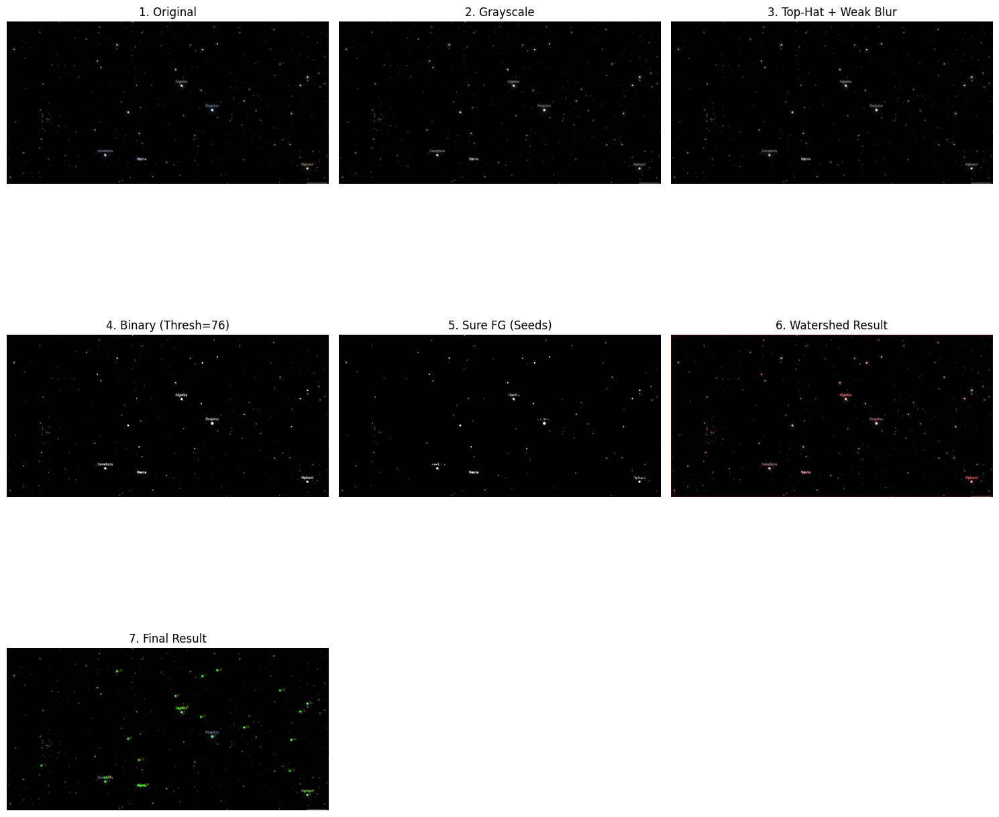

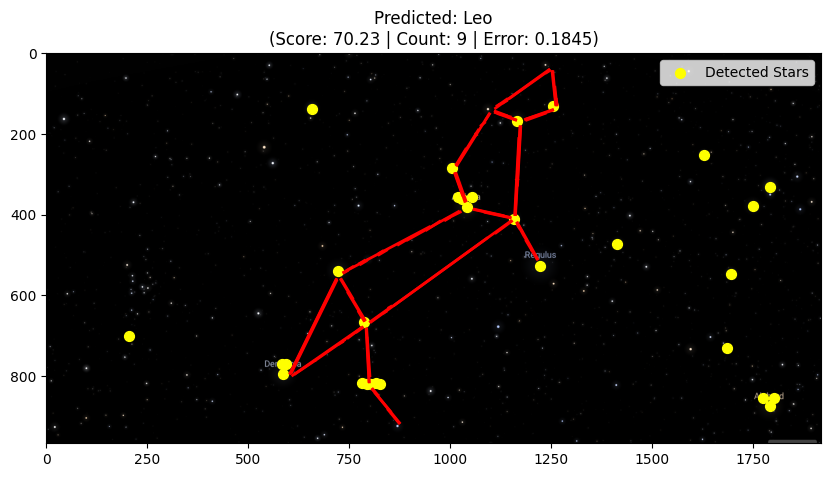

일치: Leo
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 150


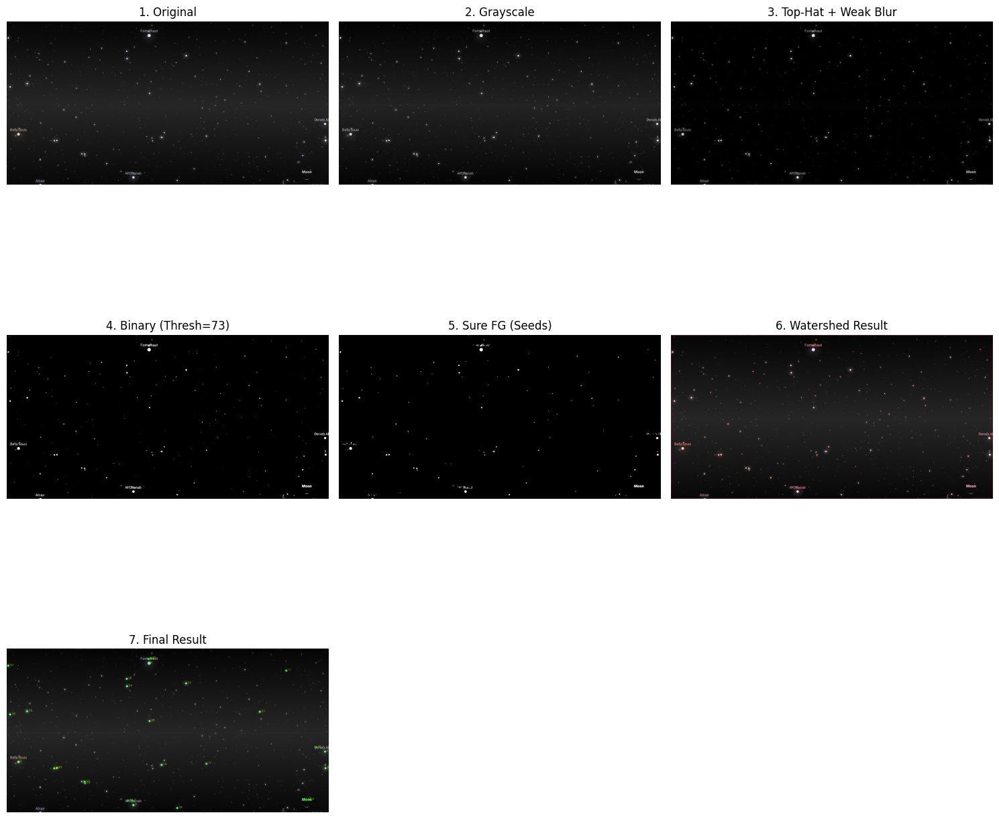

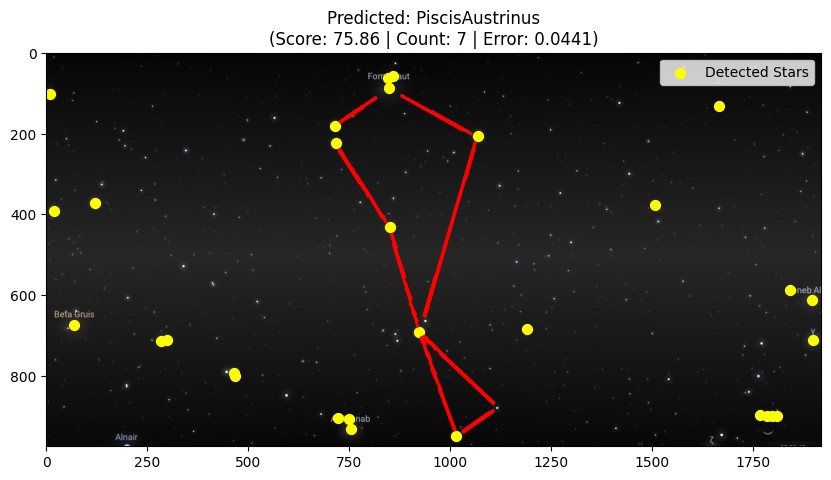

일치: PiscisAustrinus
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 65


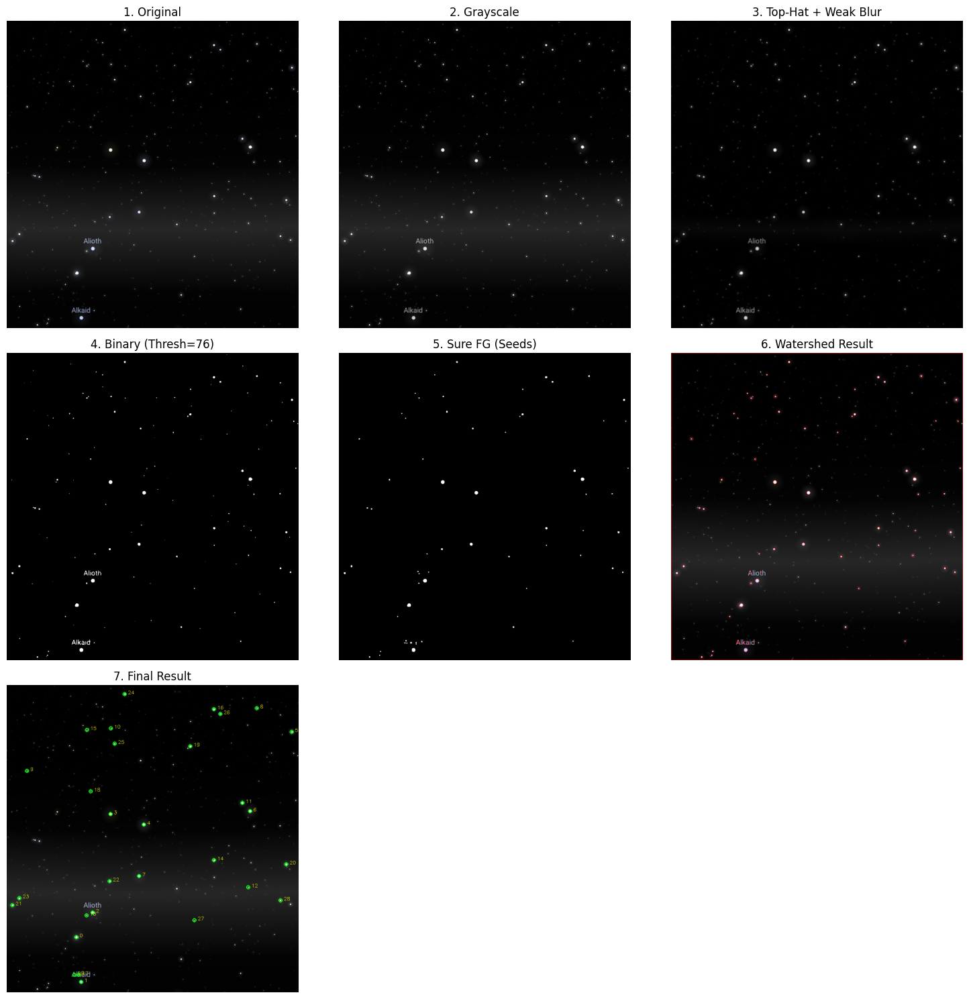

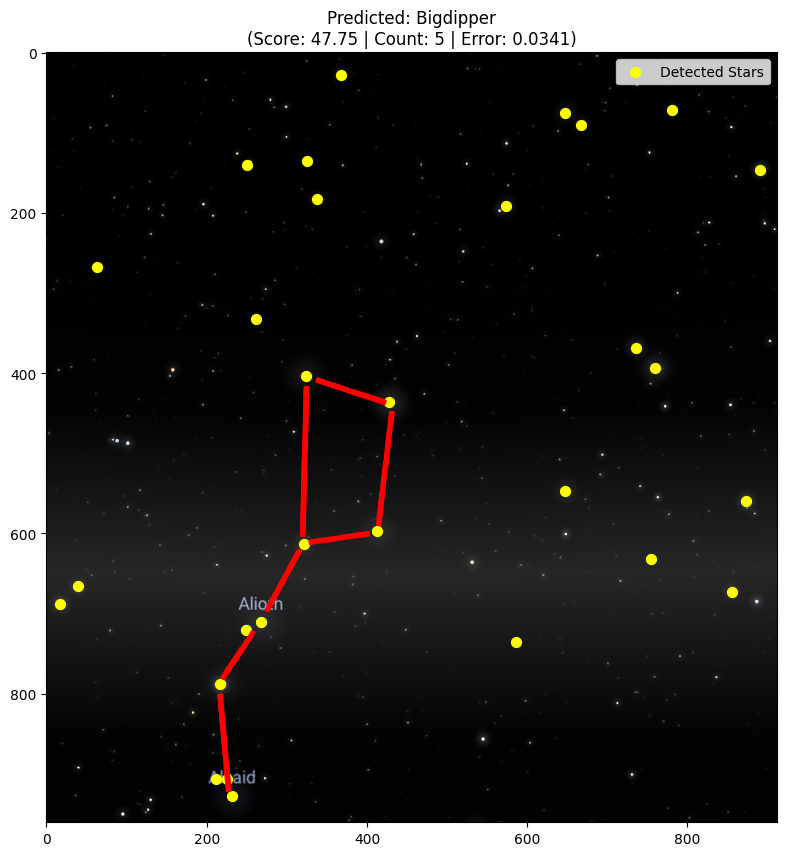

불일치: 실제=UrsaMajor, 예측=Bigdipper
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 178


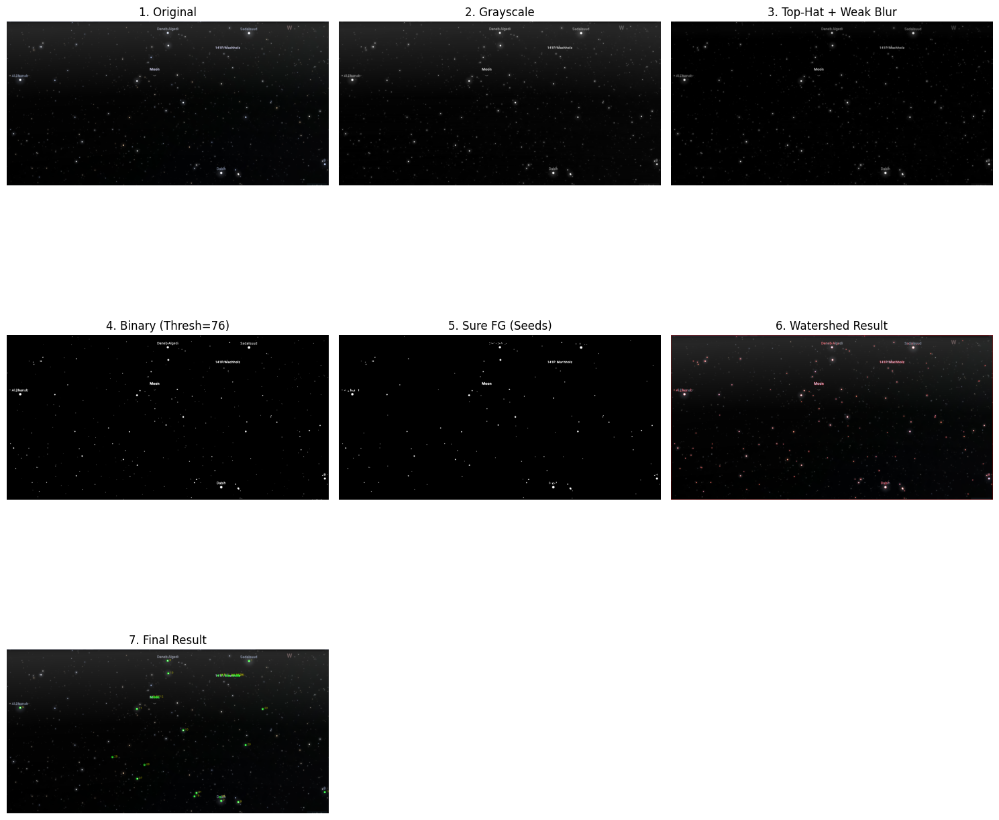

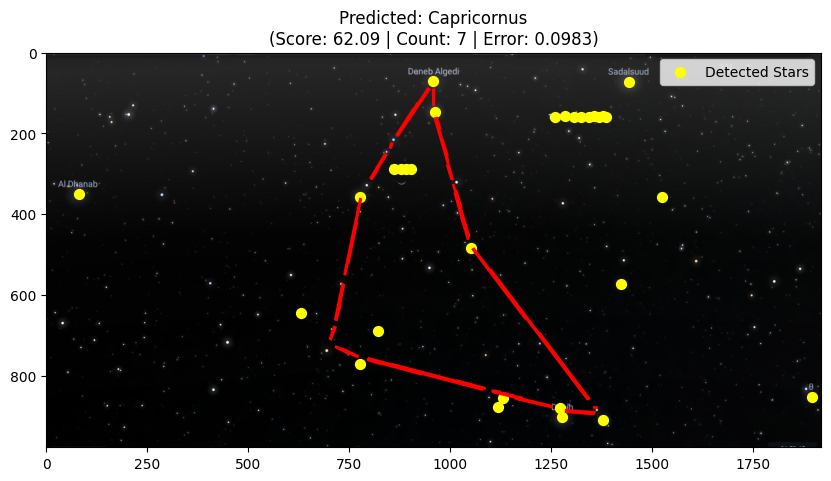

일치: Capricornus
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 313


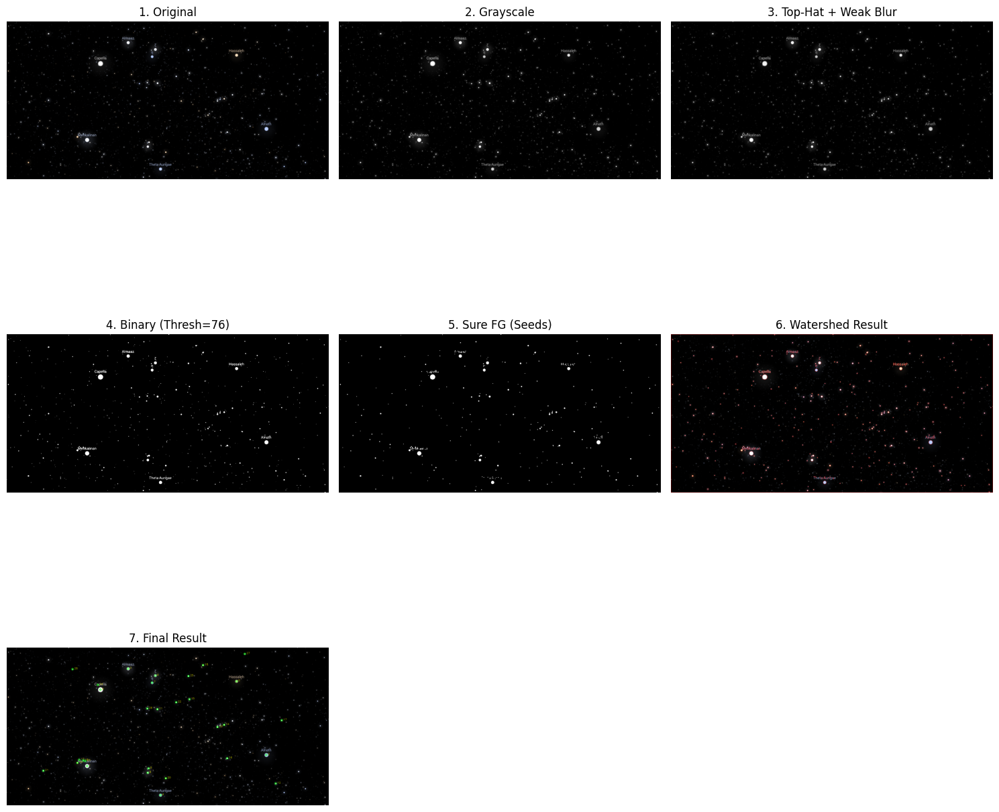

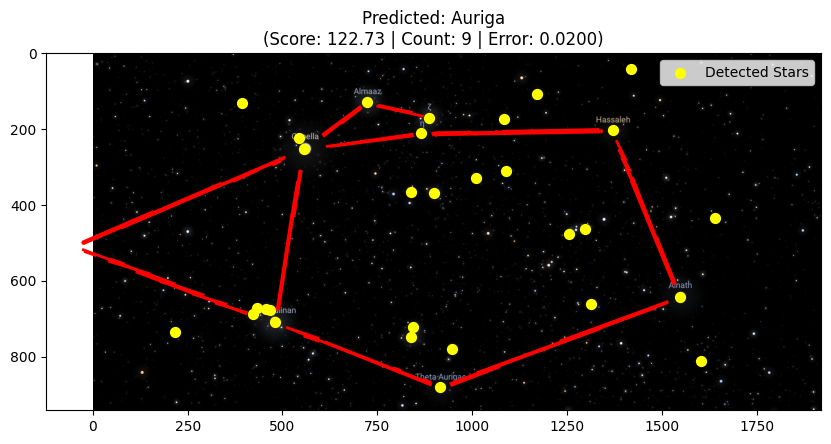

일치: Auriga
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 179


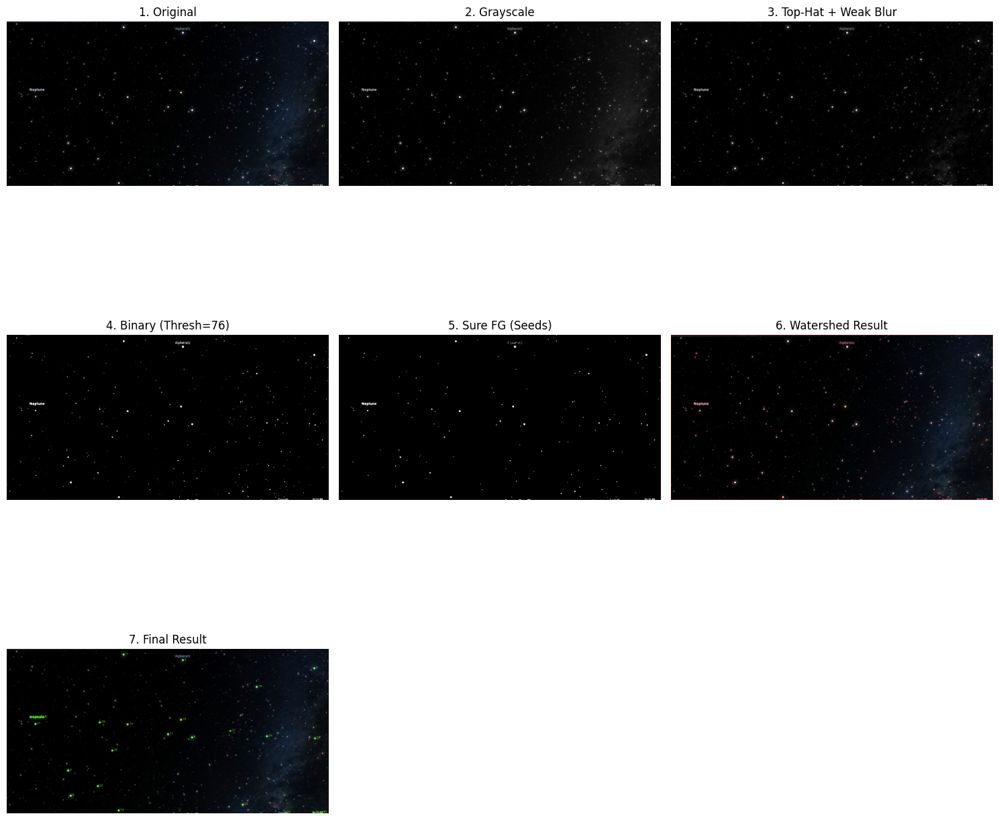

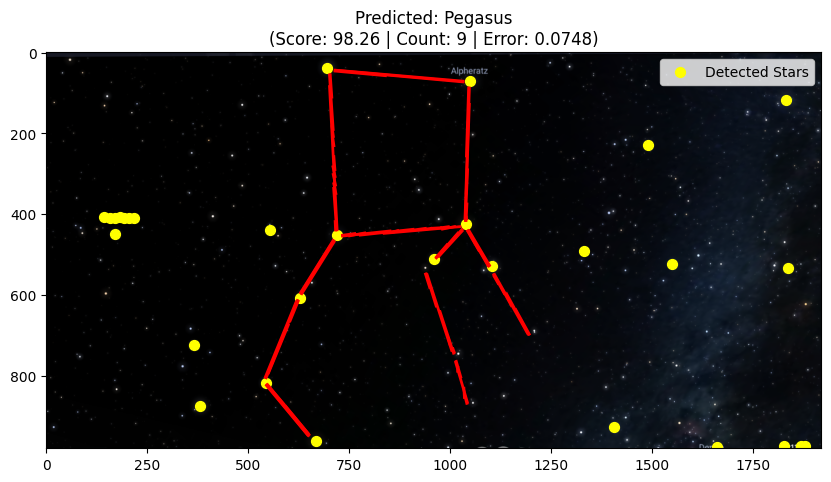

일치: Pegasus
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 368


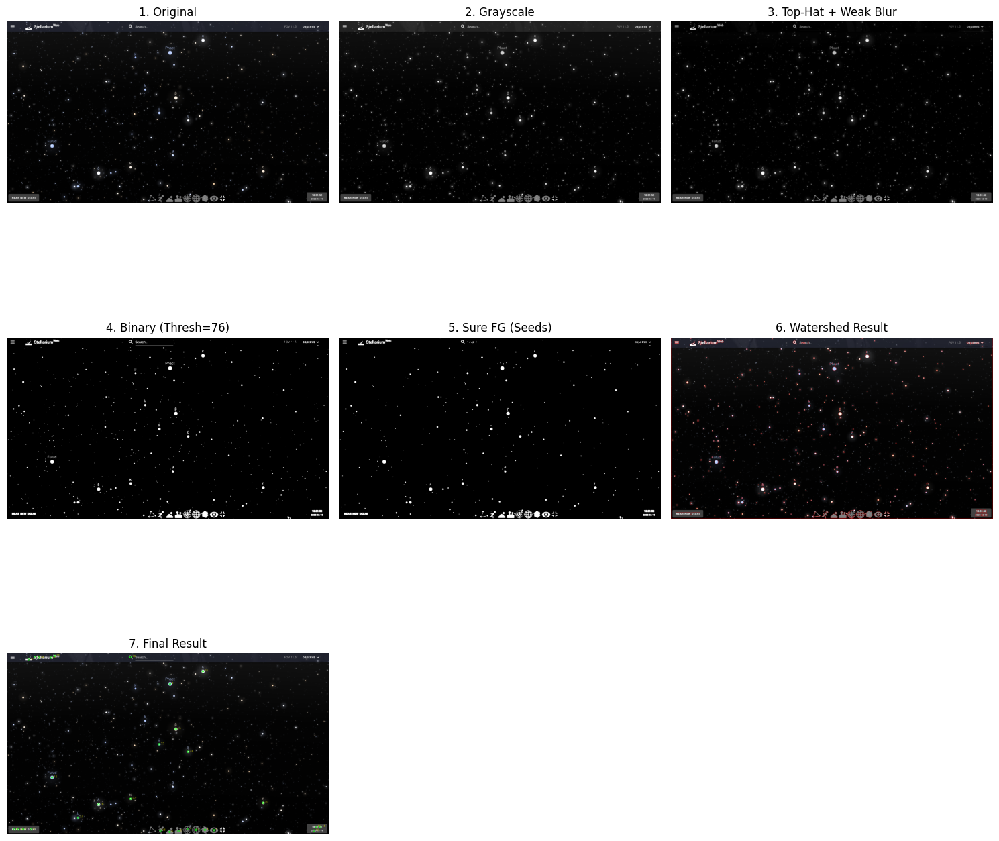

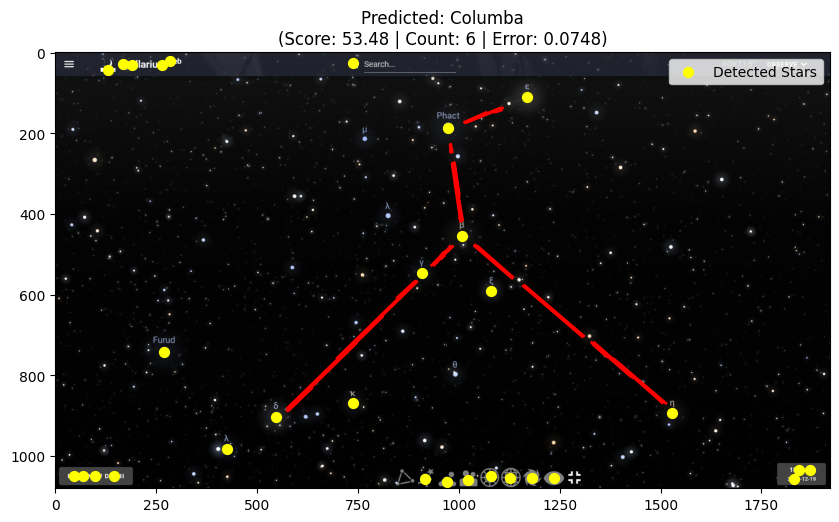

일치: Columba
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 207


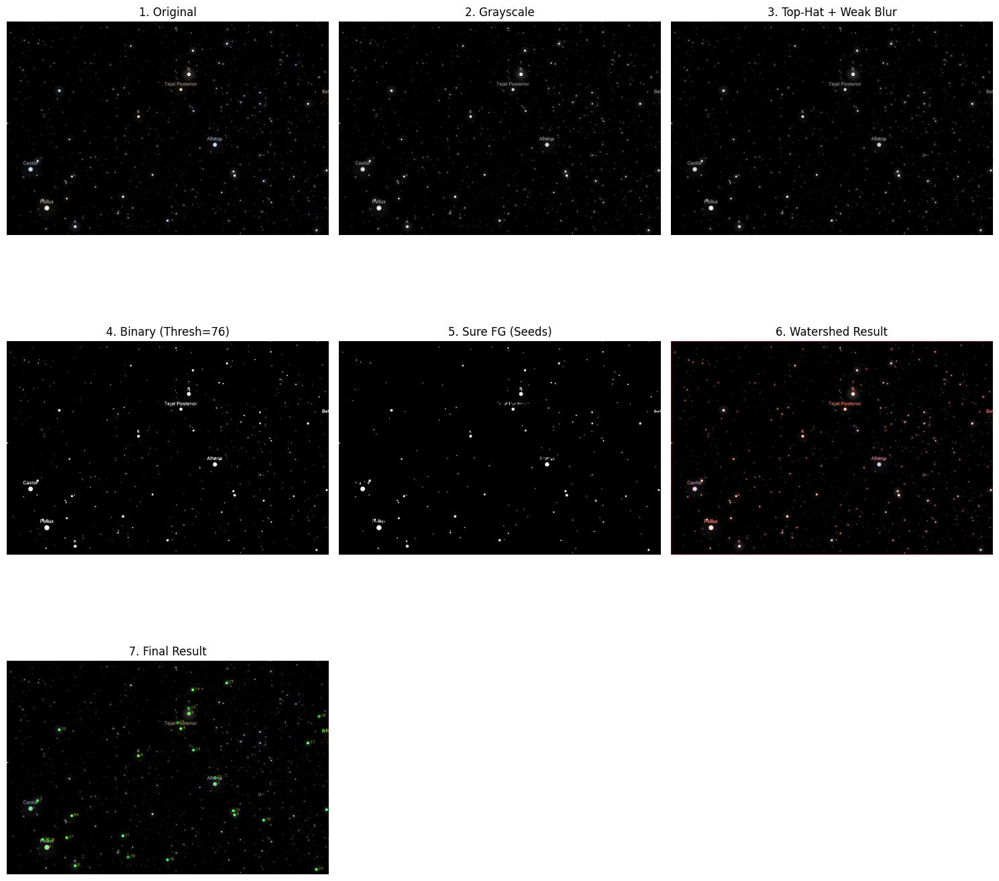

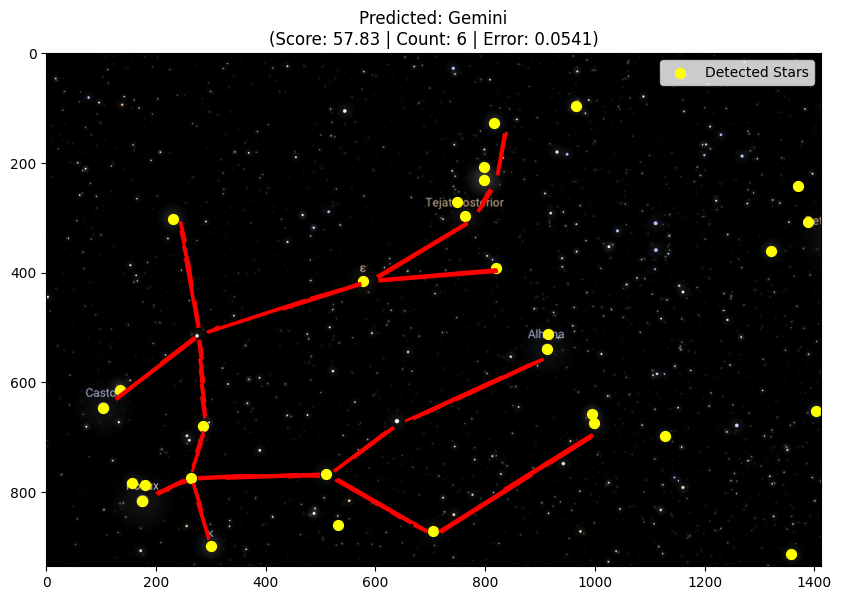

일치: Gemini
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 361


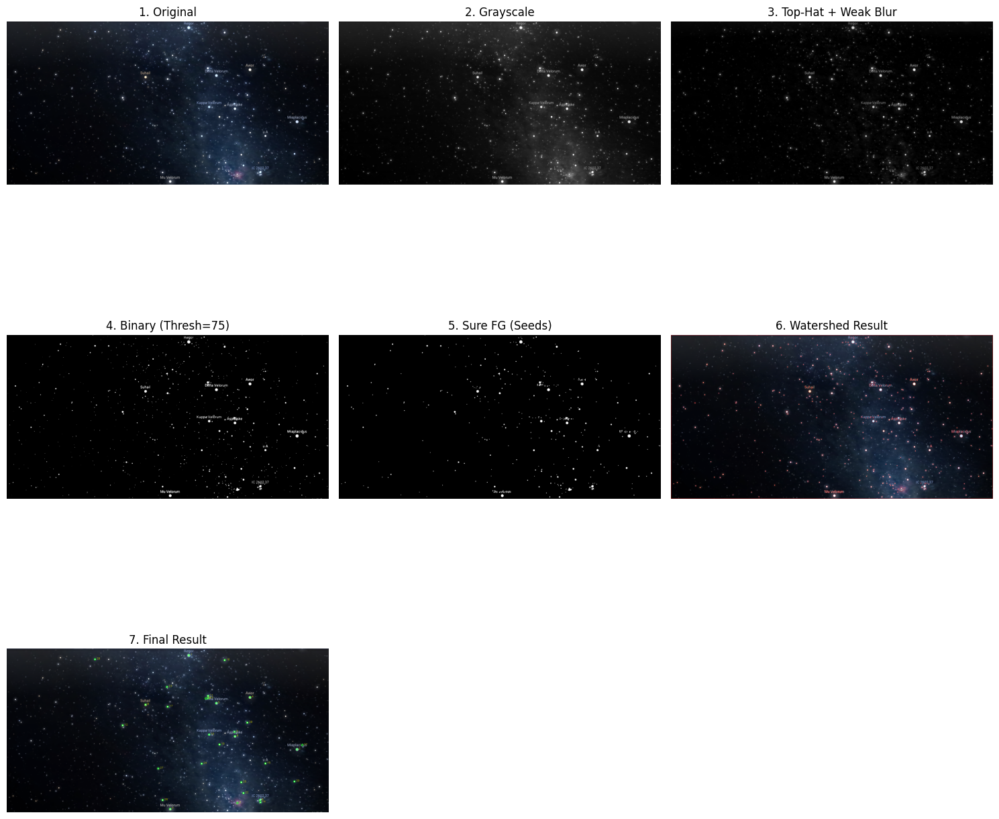

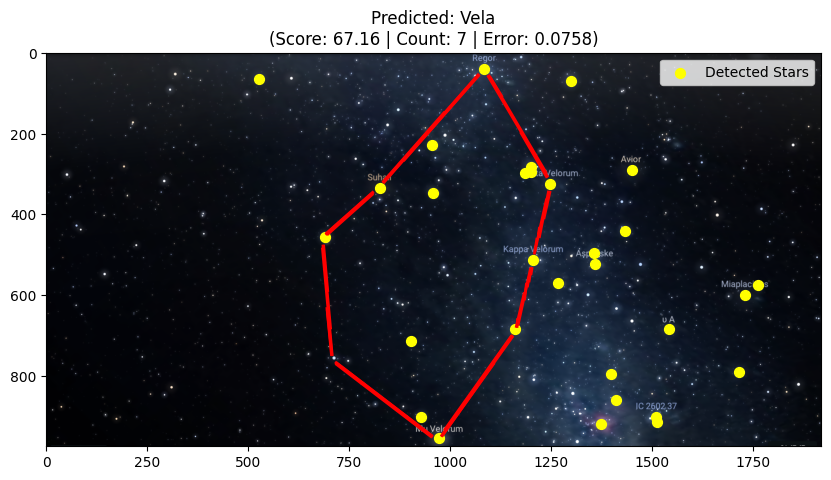

일치: Vela
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 368


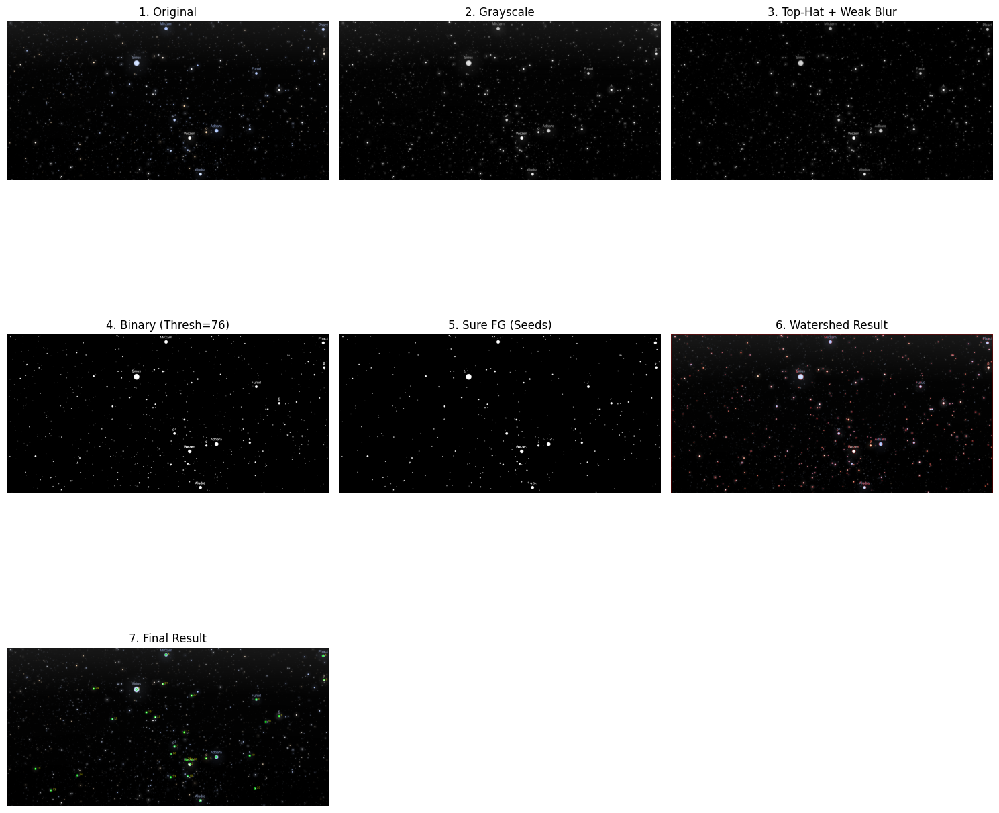

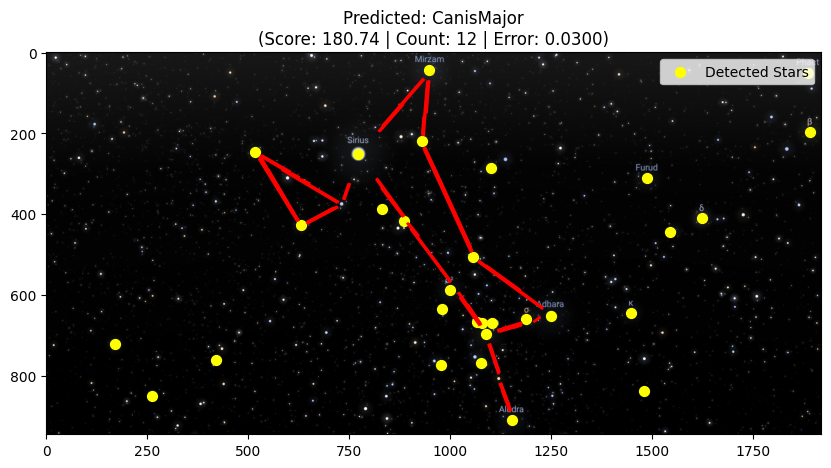

일치: CanisMajor
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 194


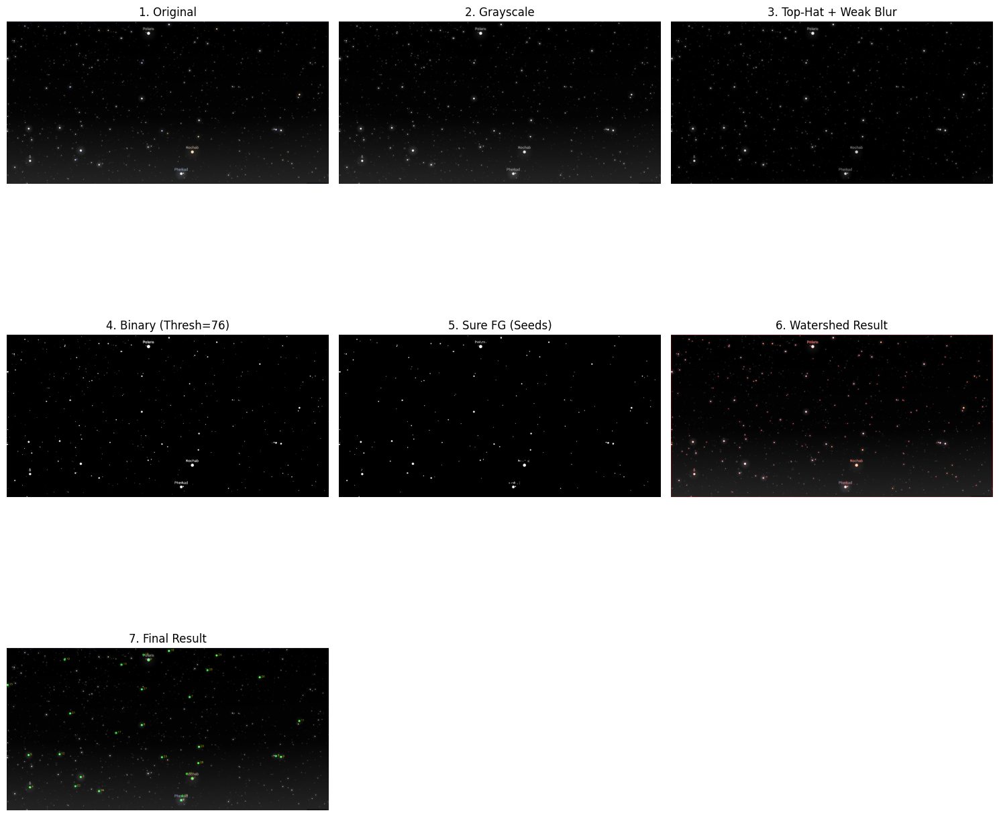

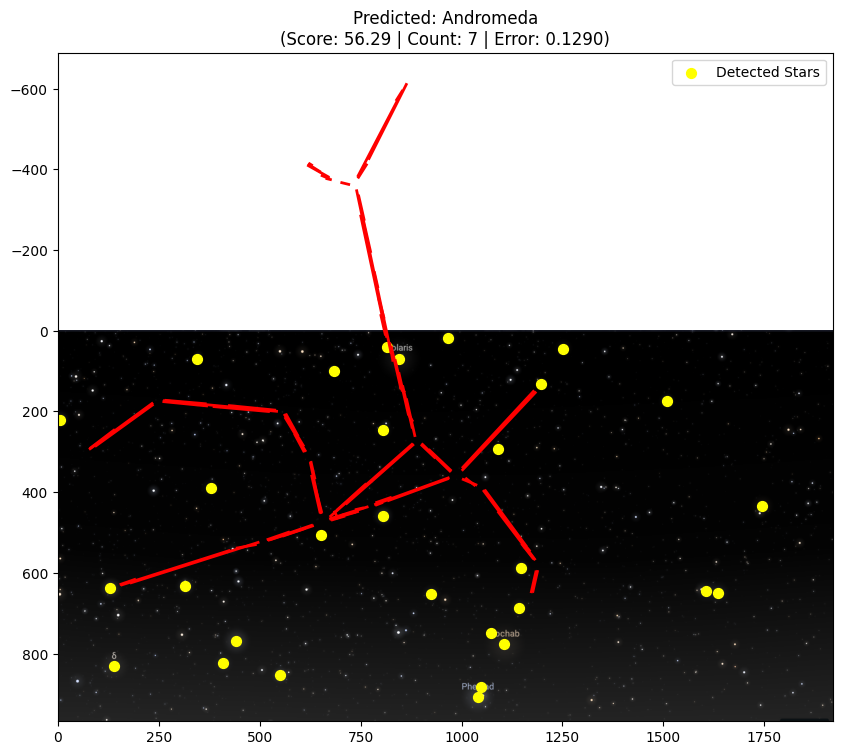

불일치: 실제=UrsaMinor, 예측=Andromeda
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 284


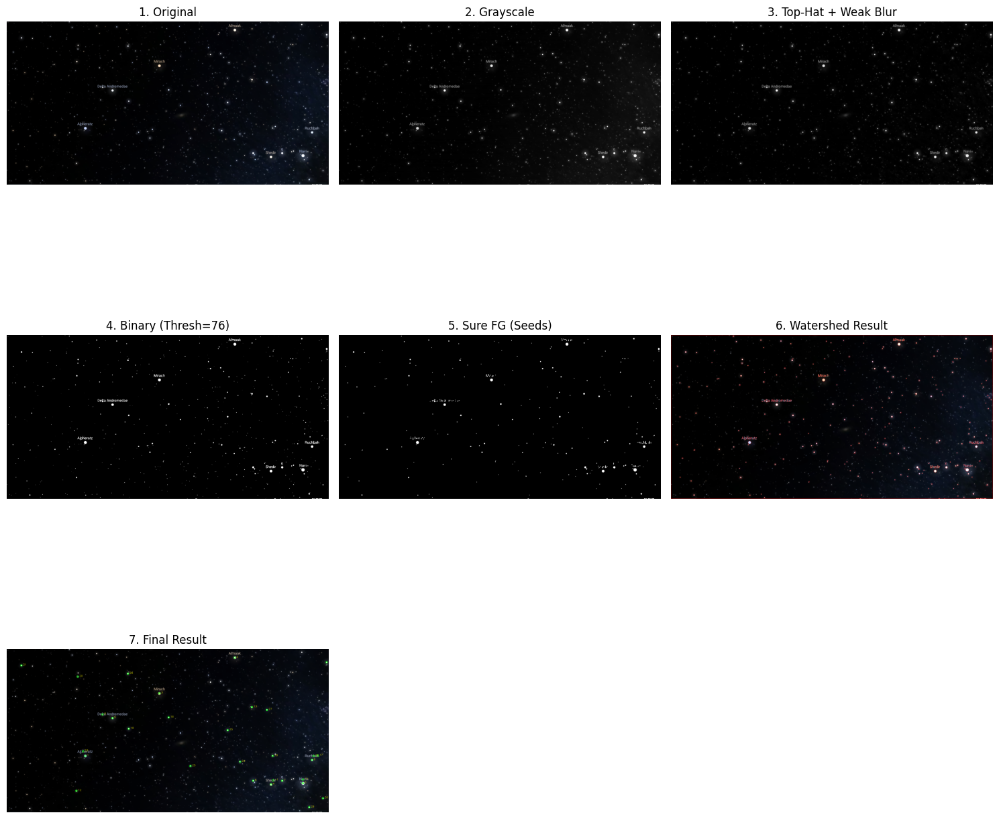

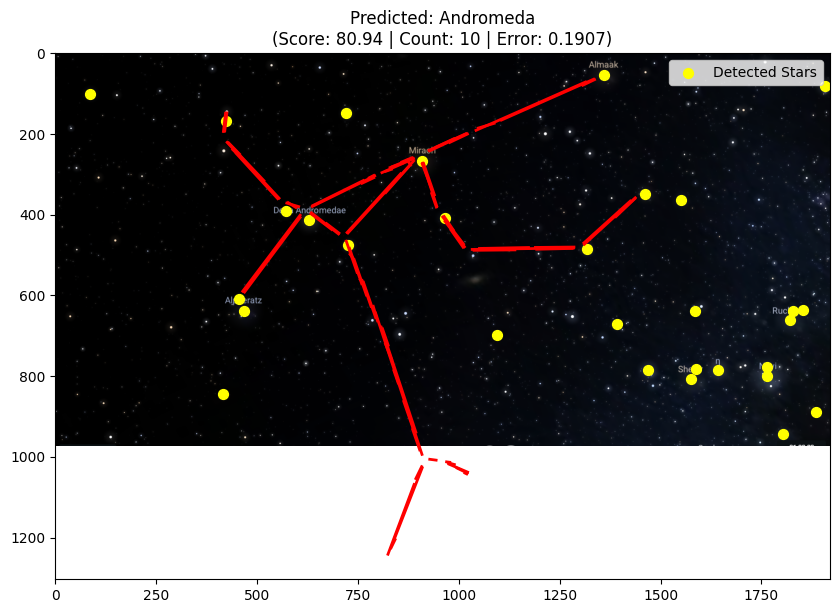

일치: Andromeda
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 331


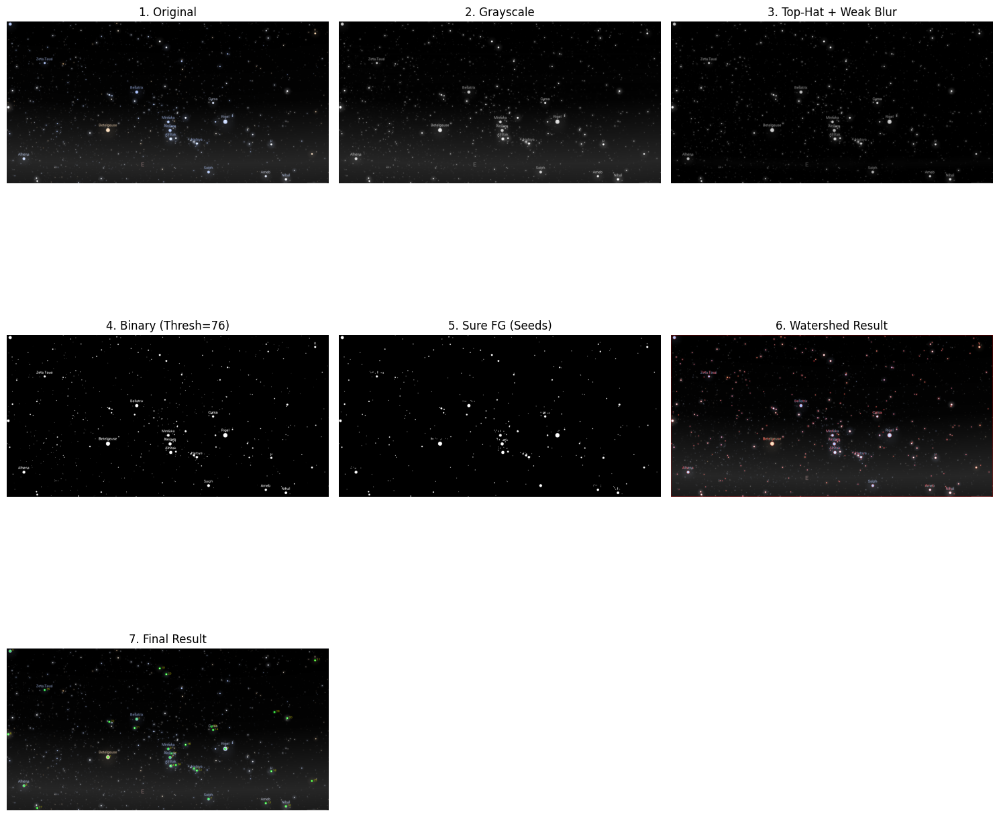

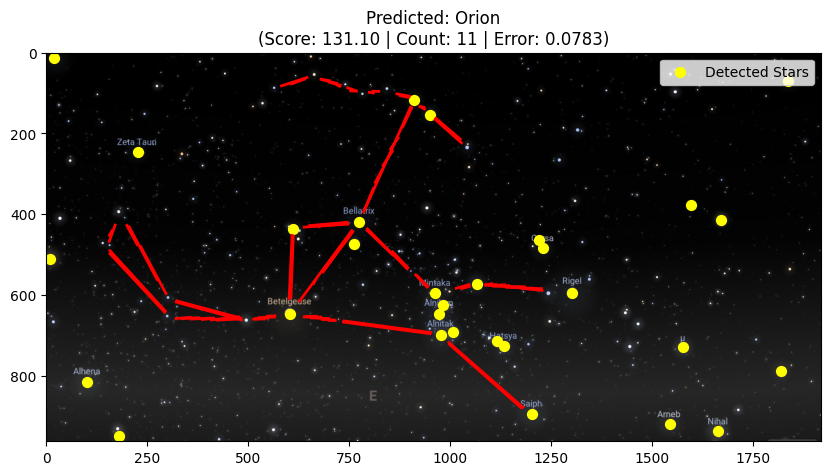

일치: Orion
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 165


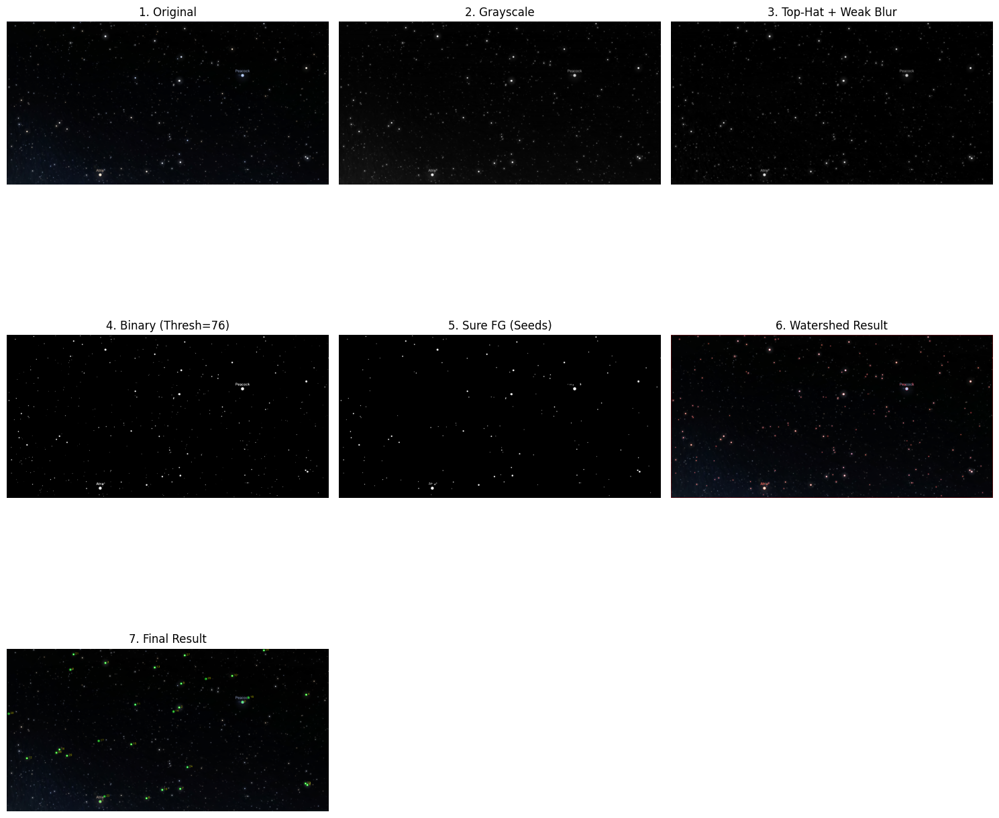

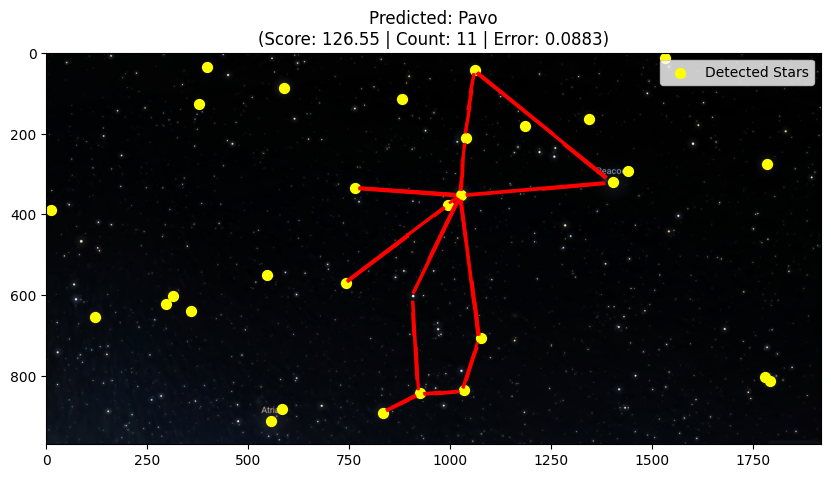

일치: Pavo
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 259


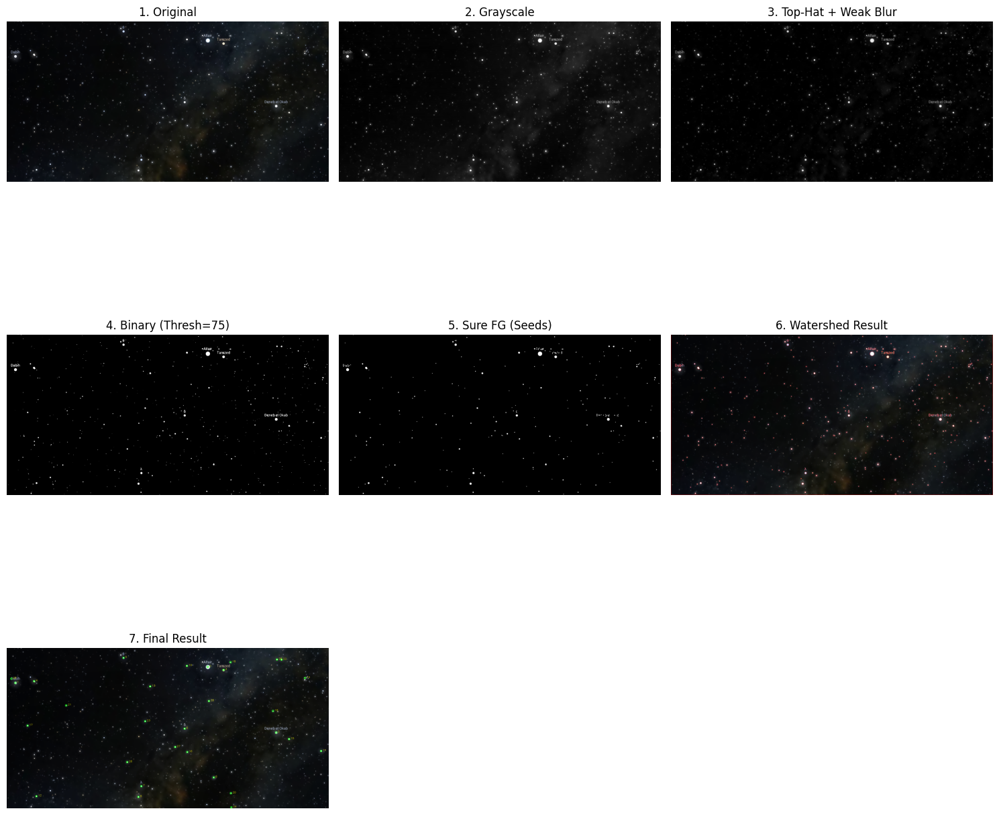

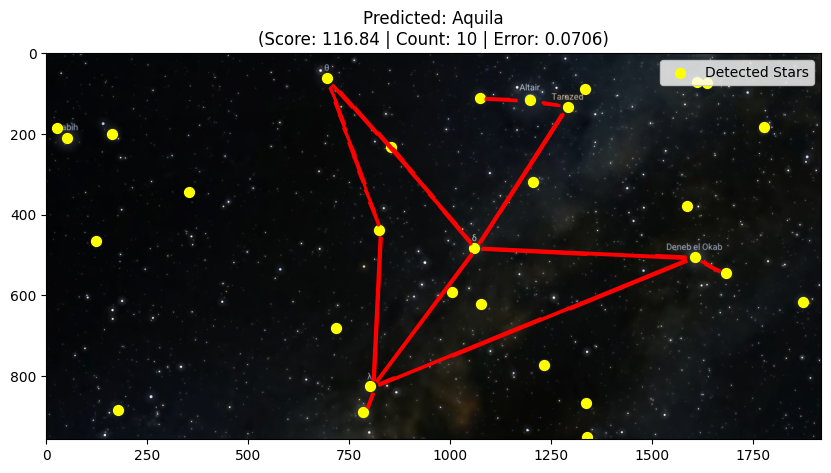

일치: Aquila
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 341


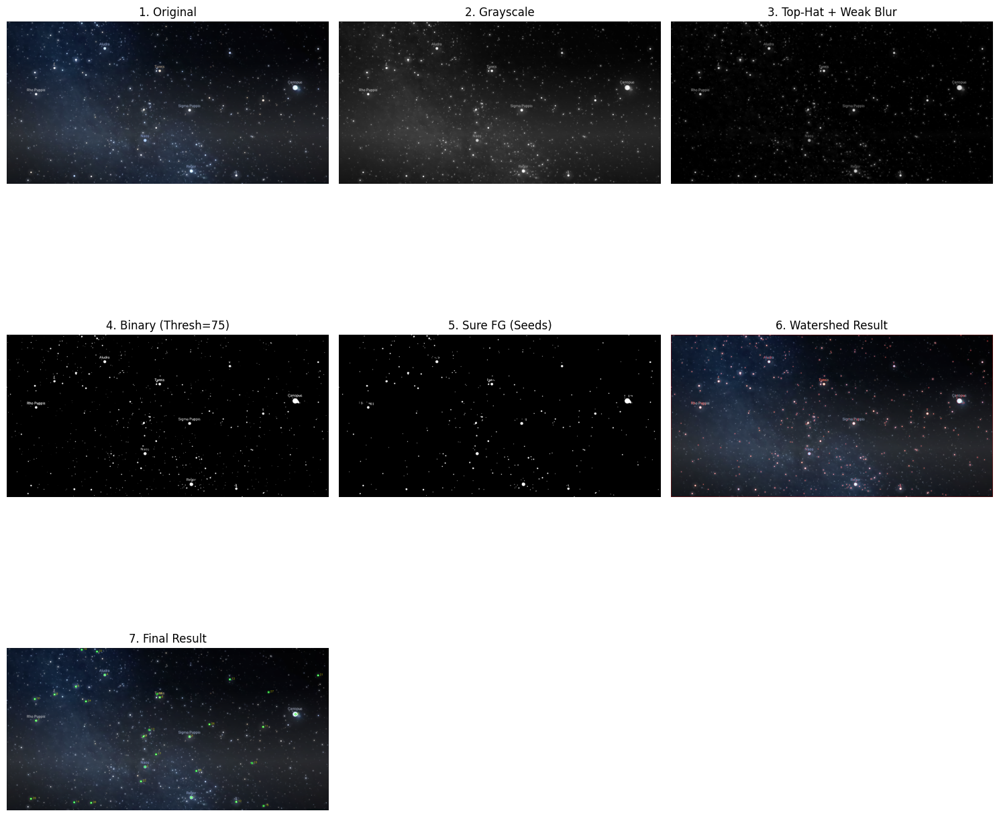

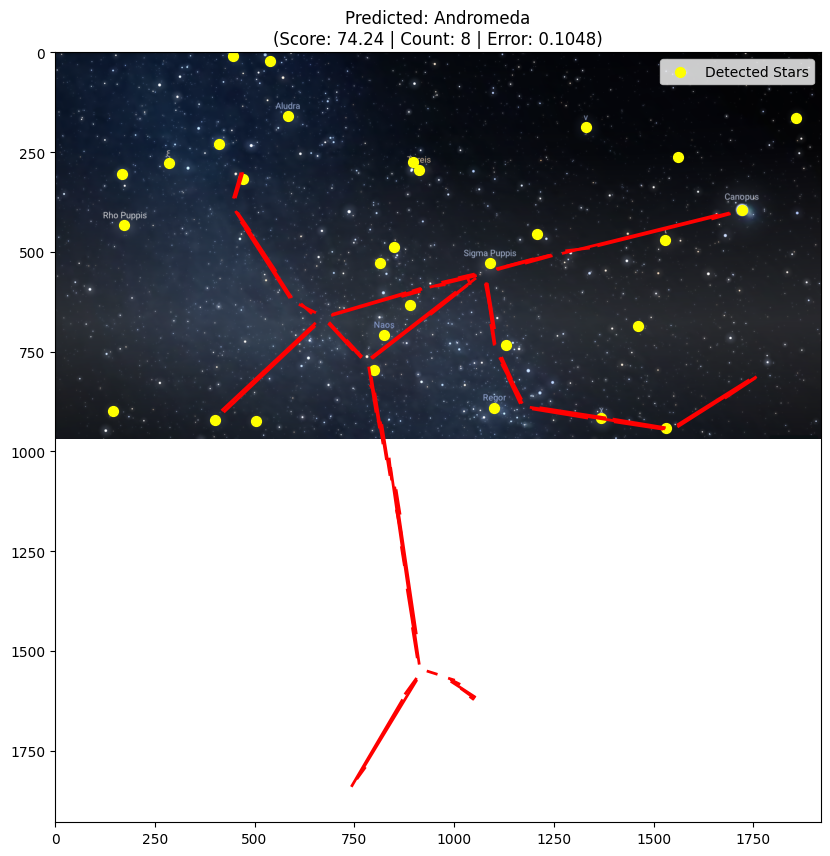

불일치: 실제=Puppis, 예측=Andromeda
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 200


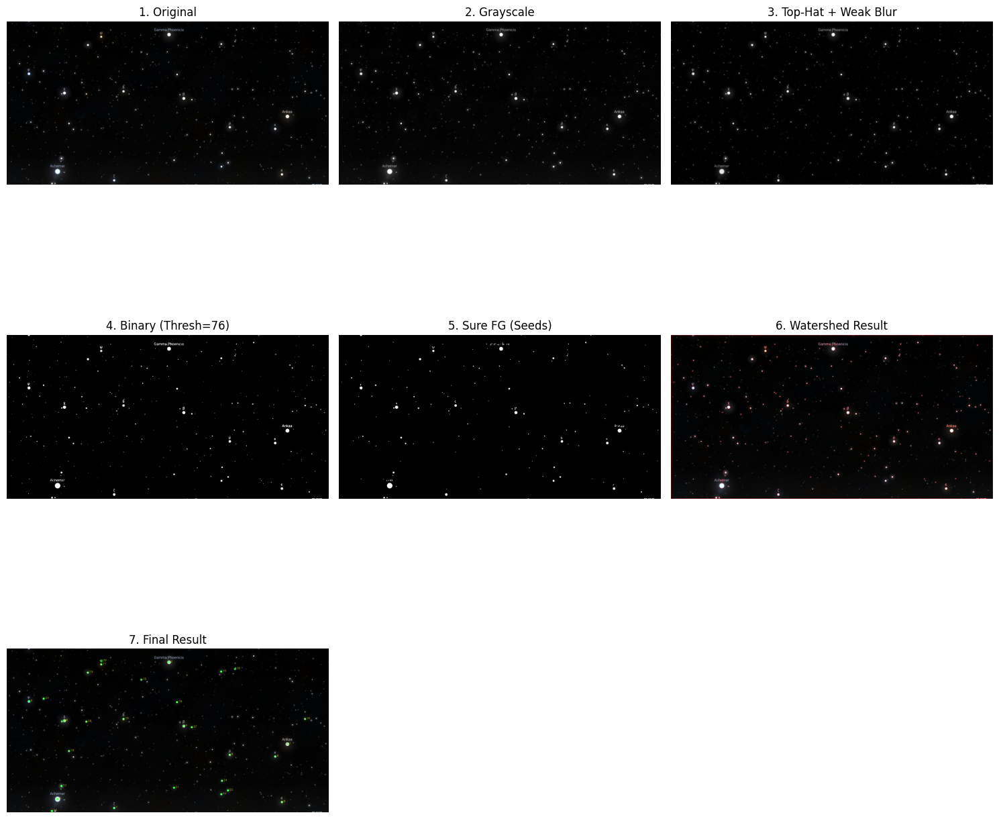

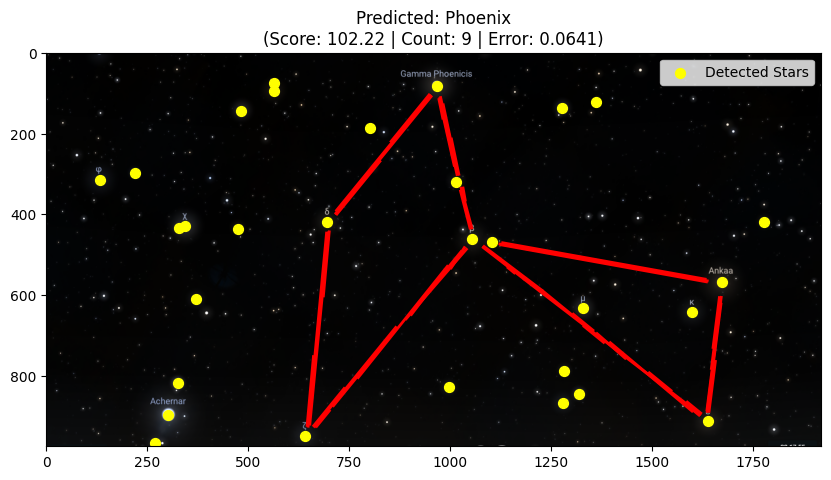

일치: Phoenix
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 110


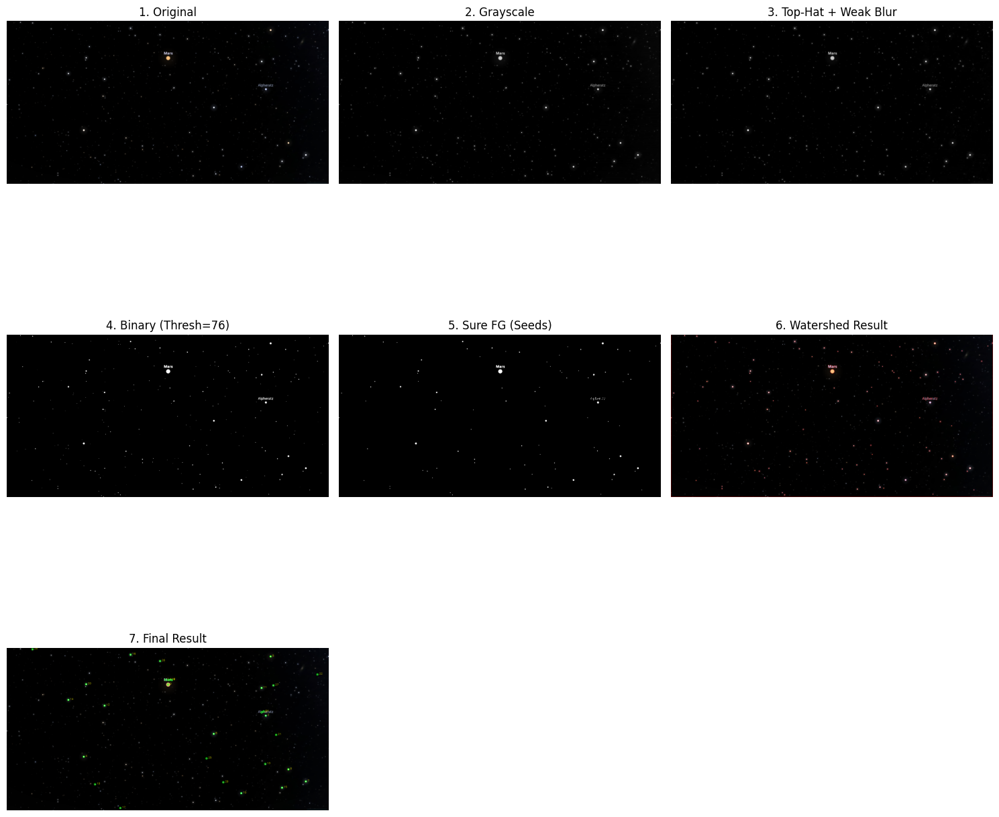

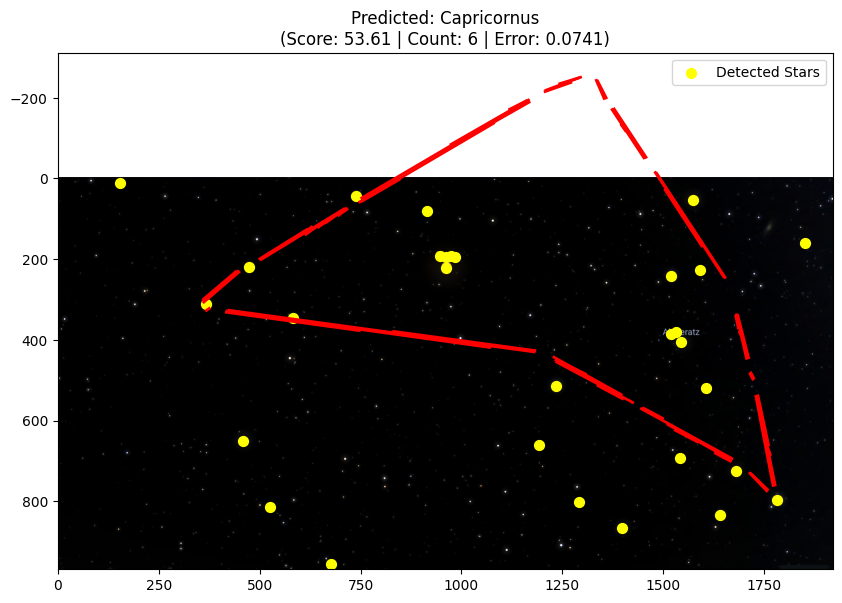

불일치: 실제=Pisces, 예측=Capricornus
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 207


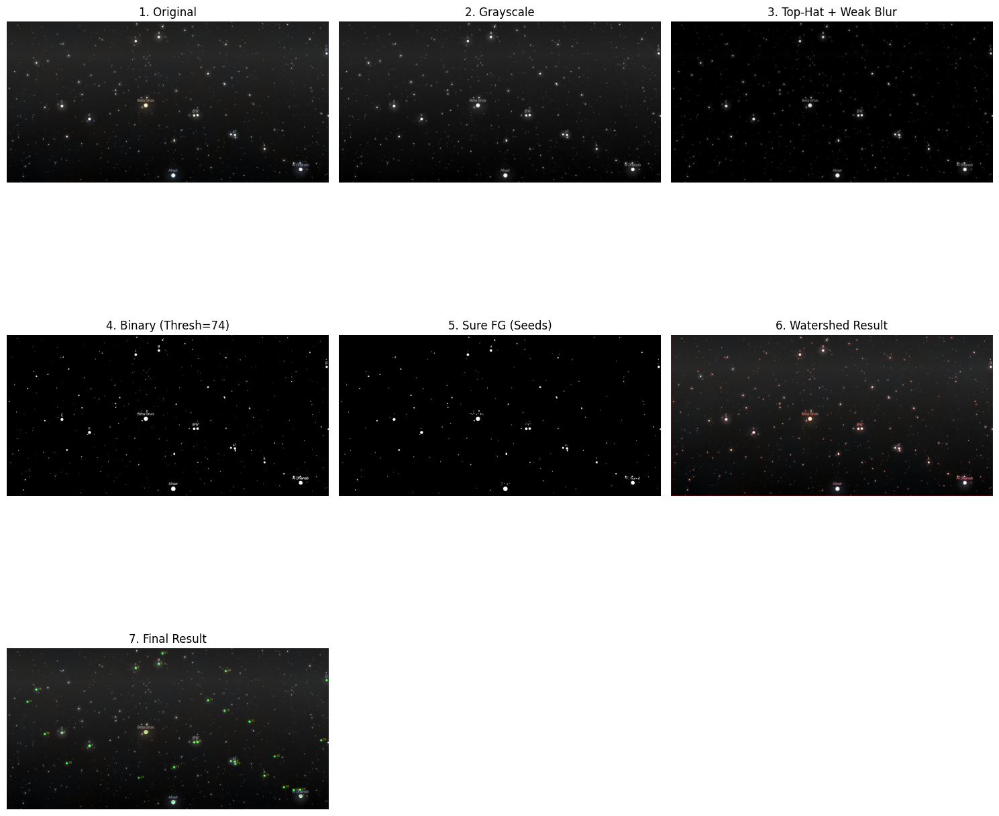

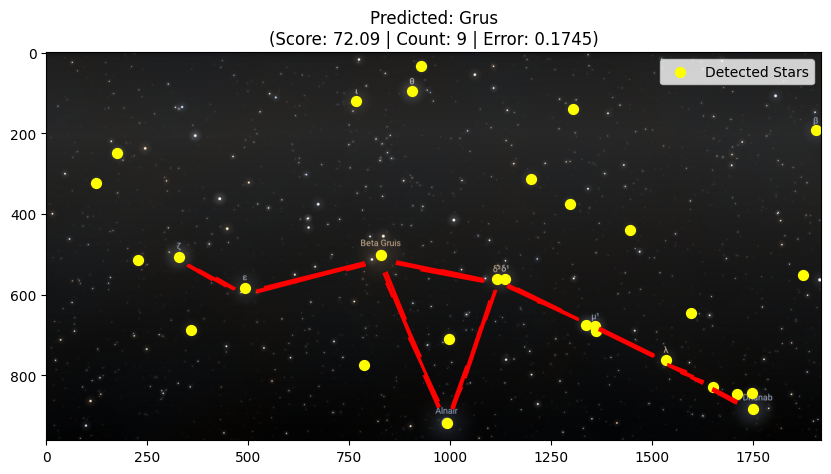

일치: Grus
최종 선별된 별 개수(중복 제거 후): 30
1차 검출된 전체 별 개수: 113


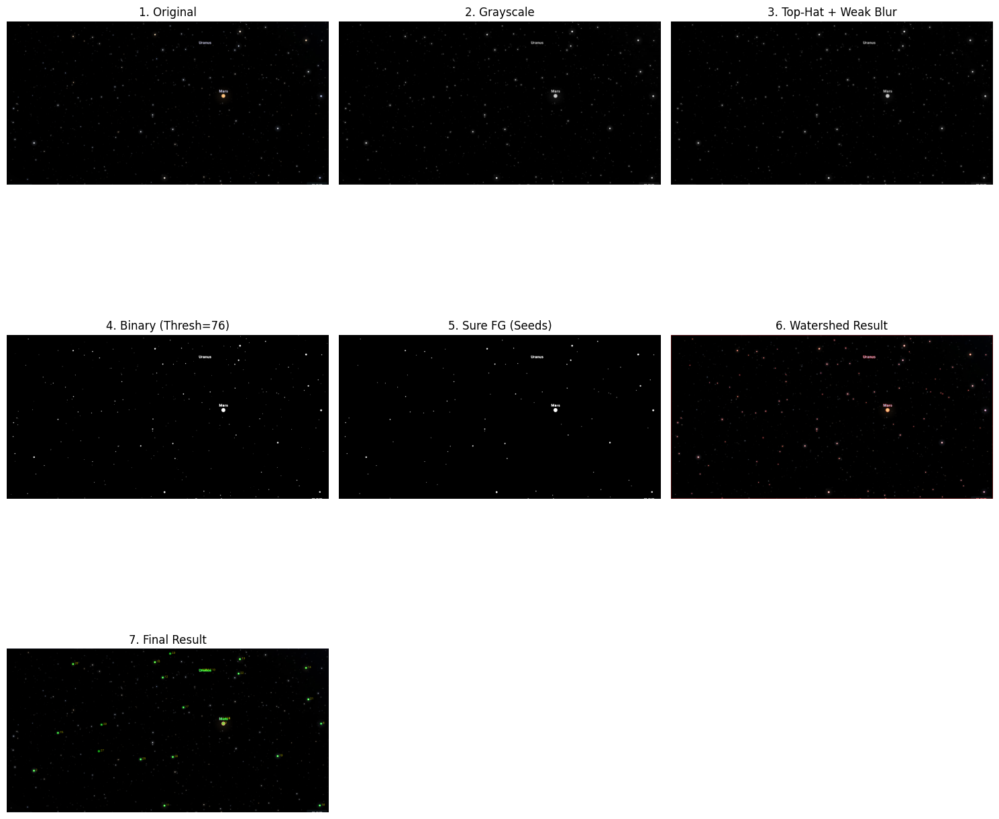

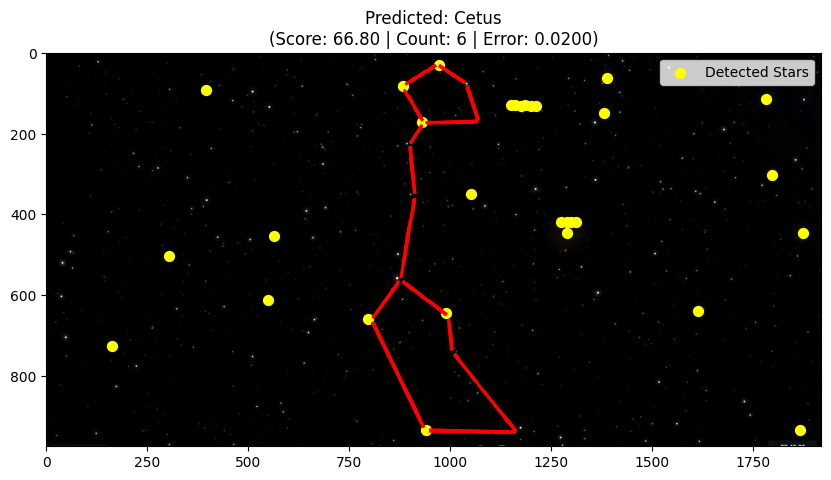

일치: Cetus
--- 테스트 완료 ---
정확도: 16 / 20 = 0.8000
매칭 실패: 0
불일치: 4


In [18]:
# ==================================================================
# 9. 전체 함수 실행
# ==================================================================

if __name__ == "__main__":
    testset_directory = DATA_PATH + '/test_data/'
    n = len(os.listdir(testset_directory))
    print(f"총 {n}개의 샘플을 테스트합니다.")

    count1 = 0
    count2 = 0
    count3 = 0

    for filename in os.listdir(testset_directory):
        filepath = os.path.join(testset_directory, filename)
        true_label, ext = os.path.splitext(filename)

        #pred = test_runner(filepath)

        # =========================================================
        # [핵심 수정] 함수가 이제 (예측값, 결과이미지) 두 개를 줍니다.
        # =========================================================
        try:
            pred, processed_image = test_runner(filepath)
        except ValueError:
            # 만약 test_runner를 아직 수정 안 해서 에러가 난다면
            print("⚠️ test_runner 함수 반환값이 수정되지 않았습니다.")
            pred = test_runner(filepath)
            processed_image = None

        # ---------------------------------------------------------
        # 결과 이미지 저장 (좌표 찍힌 사진)
        # ---------------------------------------------------------
        if processed_image is not None:
            # 파일명: 원본이름_예측결과_result.jpg
            save_path = f"./Predicted_images/{filename}_{pred}_result.jpg"
            cv2.imwrite(save_path, processed_image)
        # ---------------------------------------------------------

        if pred == true_label:
            print(f"일치: {true_label}")
            count1 += 1
        elif pred == 'None':
            print(f"매칭 실패: {true_label}")
            count2 += 1
        else:
            print(f"불일치: 실제={true_label}, 예측={pred}")
            count3 += 1

    print("--- 테스트 완료 ---")
    print(f"정확도: {count1} / {n} = {count1 / n:.4f}")
    print(f"매칭 실패: {count2}")
    print(f"불일치: {count3}")